 [Zillow’s Home Value Prediction](https://www.kaggle.com/c/zillow-prize-1)

### Working directory & import library

In [4]:
%load_ext autotime 
import os
ipynb = r"D:\WinPython-64bit-3.6.1.0Qt5\notebooks\0700 Kaggle competition\22 Zillow Home Value Prediction"
ipynb = ipynb.replace("\\","/")
os.chdir(ipynb) 
datadir = r"E:\0700 Kaggle competition\22 Zillow Home Value Prediction\data"
datadir = datadir.replace("\\","/")
datadir

import sklearn as sk
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
color = sns.color_palette()
import rpy2
from rpy2.robjects import r
from IPython.display import display
import qgrid
import gc
from sklearn.preprocessing import StandardScaler, LabelEncoder
os.listdir(datadir)

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime


'E:/0700 Kaggle competition/22 Zillow Home Value Prediction/data'

['properties_2016.csv',
 'properties_2017.csv',
 'sample_submission.csv',
 'train_2016_v2.csv',
 'train_2017.csv',
 'zillow_data_dictionary.xlsx']

time: 117 ms


# Loading data files

Create a customed function to have a glimpse the data

In [5]:
def view_data(df):
    print('\033[1m' + 'Dataset size & variable types:' + '\033[0m')
    df.info()
    print('\033[1m' + 'Preview first & last 10 rows:' + '\033[0m')
    display(pd.concat([df.head(10),df.tail(10)]))

time: 6 ms


## .csv files

In [7]:
properties_2016 = pd.read_csv(datadir + "/properties_2016.csv")

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\IPython\core\interactiveshell.py:2698: DtypeWarning: Columns (22,32,34,49,55) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


time: 16.2 s


https://stackoverflow.com/questions/24251219/pandas-read-csv-low-memory-and-dtype-options

In [26]:
view_data(properties_2016)

Dataset size & variable types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2985217 entries, 0 to 2985216
Data columns (total 58 columns):
parcelid                        int64
airconditioningtypeid           float64
architecturalstyletypeid        float64
basementsqft                    float64
bathroomcnt                     float64
bedroomcnt                      float64
buildingclasstypeid             float64
buildingqualitytypeid           float64
calculatedbathnbr               float64
decktypeid                      float64
finishedfloor1squarefeet        float64
calculatedfinishedsquarefeet    float64
finishedsquarefeet12            float64
finishedsquarefeet13            float64
finishedsquarefeet15            float64
finishedsquarefeet50            float64
finishedsquarefeet6             float64
fips                            float64
fireplacecnt                    float64
fullbathcnt                     float64
garagecarcnt                    float64
garagetotalsqft   

,parcelid,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,...,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock
0,10754147,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.0,2015.0,9.0,NaN,NaN,NaN,NaN
1,10759547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,27516.0,2015.0,27516.0,NaN,NaN,NaN,NaN
2,10843547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,650756.0,1413387.0,2015.0,762631.0,20800.37,NaN,NaN,NaN
3,10859147,NaN,NaN,NaN,0.0,0.0,3.0,7.0,NaN,NaN,...,1.0,NaN,571346.0,1156834.0,2015.0,585488.0,14557.57,NaN,NaN,NaN
4,10879947,NaN,NaN,NaN,0.0,0.0,4.0,NaN,NaN,NaN,...,NaN,NaN,193796.0,433491.0,2015.0,239695.0,5725.17,NaN,NaN,NaN
5,10898347,NaN,NaN,NaN,0.0,0.0,4.0,7.0,NaN,NaN,...,1.0,NaN,176383.0,283315.0,2015.0,106932.0,3661.28,NaN,NaN,NaN
6,10933547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,397945.0,554573.0,2015.0,156628.0,6773.34,NaN,NaN,NaN
7,10940747,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,1.0,NaN,101998.0,688486.0,2015.0,586488.0,7857.84,NaN,NaN,NaN
8,10954547,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.0,2015.0,9.0,NaN,NaN,NaN,NaN
9,10976347,NaN,NaN,NaN,0.0,0.0,3.0,7.0,NaN,NaN,...,1.0,NaN,218440.0,261201.0,2015.0,42761.0,4054.76,NaN,NaN,NaN


time: 34 ms


In [8]:
train_2016 = pd.read_csv(datadir + "/train_2016_v2.csv")

time: 46 ms


In [85]:
view_data(train_2016)

Dataset size & variable types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90275 entries, 0 to 90274
Data columns (total 3 columns):
parcelid           90275 non-null int64
logerror           90275 non-null float64
transactiondate    90275 non-null object
dtypes: float64(1), int64(1), object(1)
memory usage: 2.1+ MB
Preview first & last 10 rows:


,parcelid,logerror,transactiondate
0,11016594,0.0276,2016-01-01
1,14366692,-0.1684,2016-01-01
2,12098116,-0.0040,2016-01-01
3,12643413,0.0218,2016-01-02
4,14432541,-0.0050,2016-01-02
5,11509835,-0.2705,2016-01-02
6,12286022,0.0440,2016-01-02
7,17177301,0.1638,2016-01-02
8,14739064,-0.0030,2016-01-02
9,14677559,0.0843,2016-01-03


time: 18 ms


In [5]:
sample_submission = pd.read_csv(datadir + "/sample_submission.csv")

time: 2.86 s


In [29]:
view_data(sample_submission)

Dataset size & variable types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2985217 entries, 0 to 2985216
Data columns (total 7 columns):
ParcelId    int64
201610      int64
201611      int64
201612      int64
201710      int64
201711      int64
201712      int64
dtypes: int64(7)
memory usage: 159.4 MB
Preview first & last 10 rows:


,ParcelId,201610,201611,201612,201710,201711,201712
0,10754147,0,0,0,0,0,0
1,10759547,0,0,0,0,0,0
2,10843547,0,0,0,0,0,0
3,10859147,0,0,0,0,0,0
4,10879947,0,0,0,0,0,0
5,10898347,0,0,0,0,0,0
6,10933547,0,0,0,0,0,0
7,10940747,0,0,0,0,0,0
8,10954547,0,0,0,0,0,0
9,10976347,0,0,0,0,0,0


time: 11 ms


It can be seen that the three 3 data files have the same key Parcelid. Let's check if they are subset of each other

In [87]:
set(train_2016.parcelid).issubset(set(properties_2016.parcelid))
set(train_2016.parcelid).issubset(set(sample_submission.ParcelId))
set(sample_submission.ParcelId).issubset(set(properties_2016.parcelid))
set(properties_2016.parcelid).issubset(set(sample_submission.ParcelId))

True

True

True

True

time: 3.84 s


It turns out that train is subset of sample_submission (test set), which is equal to properties
There are 2 things we need to predict:
* Whether or not the properties will be transacted in the given month
* What is the log error will be

Check if a properties have 2 transaction in a month

## Excel file

In [14]:
data_dictionary = pd.read_excel(datadir + "/zillow_data_dictionary.xlsx",None)
data_dictionary

{'AirConditioningTypeID':     AirConditioningTypeID AirConditioningDesc
 0                       1             Central
 1                       2       Chilled Water
 2                       3  Evaporative Cooler
 3                       4         Geo Thermal
 4                       5                None
 5                       6               Other
 6                       7    Packaged AC Unit
 7                       8             Partial
 8                       9       Refrigeration
 9                      10         Ventilation
 10                     11           Wall Unit
 11                     12         Window Unit
 12                     13                 Yes,
 'ArchitecturalStyleTypeID':     ArchitecturalStyleTypeID         ArchitecturalStyleDesc
 0                          1                        A-Frame
 1                          2                       Bungalow
 2                          3                       Cape Cod
 3                          4               

time: 981 ms


This file tell us all infos about the data fields. Very important file :)
It turns out the excel file has more than 1 sheet. This loop below will display all the content of all the sheets

In [24]:
for i in range(len(data_dictionary.keys())): 
    print('\033[1m' + list(data_dictionary.keys())[i] + '\033[0m')
    with pd.option_context("display.max_colwidth",1000):
        list(data_dictionary.values())[i] 
# dict doesnt support index so we have to use list()
# pandas option system to display full column width

HeatingOrSystemTypeID


,HeatingOrSystemTypeID,HeatingOrSystemDesc
0,1,Baseboard
1,2,Central
2,3,Coal
3,4,Convection
4,5,Electric
5,6,Forced air
6,7,Floor/Wall
7,8,Gas
8,9,Geo Thermal
9,10,Gravity


BuildingClassTypeID


,BuildingClassTypeID,BuildingClassDesc
0,1,"Buildings having fireproofed structural steel frames carrying all wall, floor and roof loads. Wall, floor and roof structures are built of non-combustible materials."
1,2,Buildings having fireproofed reinforced concrete frames carrying all wall floor and roof loads which are all non-combustible.
2,3,"Buildings having exterior walls built of a non-combustible material such as brick, concrete, block or poured concrete. Interior partitions and roof structures are built of combustible materials. Floor may be concrete or wood frame."
3,4,Buildings having wood or wood and steel frames
4,5,Specialized buildings that do not fit in any of the above categories


StoryTypeID


,StoryTypeID,StoryDesc
0,1,Attic & Basement
1,2,Attic
2,3,Bi-Level with Attic & Basement
3,4,Bi-Level
4,5,Bi-Level with Attic
5,6,Bi-Level with Basement
6,7,Basement
7,8,Split Entry with Attic & Basement
8,9,Split Foyer with Attic & Basement
9,10,Level with Attic & Basement


ArchitecturalStyleTypeID


,ArchitecturalStyleTypeID,ArchitecturalStyleDesc
0,1,A-Frame
1,2,Bungalow
2,3,Cape Cod
3,4,Cottage
4,5,Colonial
5,6,Custom
6,7,Contemporary
7,8,Conventional
8,9,Dome
9,10,French Provincial


TypeConstructionTypeID


,TypeConstructionTypeID,TypeConstructionDesc
0,1,Adobe
1,2,Brick
2,3,Concrete Block
3,4,Concrete
4,5,Dome
5,6,Frame
6,7,Heavy
7,8,Log
8,9,Light
9,10,Metal


AirConditioningTypeID


,AirConditioningTypeID,AirConditioningDesc
0,1,Central
1,2,Chilled Water
2,3,Evaporative Cooler
3,4,Geo Thermal
4,5,None
5,6,Other
6,7,Packaged AC Unit
7,8,Partial
8,9,Refrigeration
9,10,Ventilation


Data Dictionary


,Feature,Description
0,'airconditioningtypeid',Type of cooling system present in the home (if any)
1,'architecturalstyletypeid',"Architectural style of the home (i.e. ranch, colonial, split-level, etc…)"
2,'basementsqft',Finished living area below or partially below ground level
3,'bathroomcnt',Number of bathrooms in home including fractional bathrooms
4,'bedroomcnt',Number of bedrooms in home
5,'buildingqualitytypeid',Overall assessment of condition of the building from best (lowest) to worst (highest)
6,'buildingclasstypeid',"The building framing type (steel frame, wood frame, concrete/brick)"
7,'calculatedbathnbr',Number of bathrooms in home including fractional bathroom
8,'decktypeid',Type of deck (if any) present on parcel
9,'threequarterbathnbr',Number of 3/4 bathrooms in house (shower + sink + toilet)


PropertyLandUseTypeID


,PropertyLandUseTypeID,PropertyLandUseDesc
0,31,Commercial/Office/Residential Mixed Used
1,46,Multi-Story Store
2,47,Store/Office (Mixed Use)
3,246,"Duplex (2 Units, Any Combination)"
4,247,"Triplex (3 Units, Any Combination)"
5,248,"Quadruplex (4 Units, Any Combination)"
6,260,Residential General
7,261,Single Family Residential
8,262,Rural Residence
9,263,Mobile Home


time: 60 ms


# Exploratory analysis 
kernel should be read
https://www.kaggle.com/viveksrinivasan/zillow-eda-on-missing-values-multicollinearity

# train_2016_v2.csv 

##  DT using rpy2 failed

In [10]:
from rpy2.robjects.packages import importr
DT = importr('DT')

time: 15 ms


In [23]:
# load existing dataframe from python to rpy
from rpy2.robjects import pandas2ri
pandas2ri.activate()
r_train_2016 = pandas2ri.py2ri(train_2016)

time: 384 ms


In [ ]:
from rpy2.robjects.packages import importr
DT = importr('DT')

# load existing dataframe from python to rpy
from rpy2.robjects import pandas2ri
pandas2ri.activate()
r_train_2016 = pandas2ri.py2ri(train_2016)

In [28]:
rpy2.robjects.r('head(rpy2.robjects.r('r_train_2016'),100)')

SyntaxError: invalid syntax (<ipython-input-28-b92cd7b06304>, line 1)

## Frequency table for each variable

Create a customed function to view the frequency table of each variable, either sorted by values or counts

In [6]:
def freq(df, sort = 'count'):
    """
    Frequency table of each variable, either sorted by values or counts
    Args:
        Sort: 'value' will display the frequency table by sorted values
              'count' will display the frequency table by sorted frequency  
    """
    print('\033[1m' + 'Frequency table of each variable:' + '\033[0m')
    for x in df.columns: 
        freq = df[x].value_counts(dropna = False).to_frame()
        if sort == "value" :
            freq.columns = ['Count'] 
            freq.index.names=[x] 
            display(freq.sort_index(axis=0).T)
        elif sort == 'count' :
            display(freq.sort([x], ascending = 0).T)

time: 42 ms


Sort = 'value' will display the frequency table by sorted values

In [44]:
freq(train_2016, sort = 'value')

Frequency table of each variable:


parcelid,10711738,10711755,10711805,10711816,10711858,10711910,10712086,10712162,10712163,10712195,...,162960482,162960499,162960603,162960629,162960682,162960704,162960769,162960801,162960829,162960842
Count,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


logerror,-4.605,-4.51,-3.194,-2.976,-2.688,-2.397,-2.375,-2.365,-2.354,-2.333,...,3.174,3.25,3.289,3.403,3.436,3.443,3.968,4.445,4.52,4.737
Count,2,1,1,1,1,1,1,2,3,2,...,1,1,1,1,1,1,1,1,1,1


transactiondate,2016-01-01,2016-01-02,2016-01-03,2016-01-04,2016-01-05,2016-01-06,2016-01-07,2016-01-08,2016-01-09,2016-01-10,...,2016-12-21,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30
Count,3,6,50,260,289,317,286,312,7,48,...,77,80,89,2,2,15,51,78,117,94


transaction_month,1,2,3,4,5,6,7,8,9,10,11,12
Count,6556,6333,8652,9311,9961,10922,9947,10476,9575,4977,1826,1739


time: 66 ms


Sort = 'count' will display the frequency table by sorted frequency

In [45]:
freq(train_2016, sort= 'count')

Frequency table of each variable:


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ipykernel_launcher.py:10: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  # Remove the CWD from sys.path while we load stuff.


,11842707,11183209,14615311,13003771,11122560,11742566,11121105,14607531,12921348,11476515,...,10893383,11531876,14383351,14364153,12785763,12963962,12437625,11124856,10860663,12438686
parcelid,3,2,2,2,2,2,2,2,2,2,...,1,1,1,1,1,1,1,1,1,1


,0.003,0.002,0.005,0.001,0.007,0.004,0.01,-0.005,0.006,0.0,...,0.6821,0.6622,1.229,0.9282,0.8523,0.601,1.503,-1.575,1.136,0.5134
logerror,938,915,911,901,878,869,856,853,853,847,...,1,1,1,1,1,1,1,1,1,1


,2016-07-29,2016-04-29,2016-09-30,2016-06-30,2016-05-27,2016-08-31,2016-07-01,2016-03-31,2016-07-15,2016-06-24,...,2016-11-19,2016-10-29,2016-04-16,2016-10-22,2016-06-25,2016-12-25,2016-02-13,2016-10-30,2016-06-11,2016-01-16
transactiondate,910,902,894,874,863,737,731,723,693,665,...,2,2,2,2,2,2,2,1,1,1


,6,8,5,7,9,4,3,1,2,10,11,12
transaction_month,10922,10476,9961,9947,9575,9311,8652,6556,6333,4977,1826,1739


time: 61 ms


## Qgrid for better view of data

In [ ]:
qgrid.show_grid(train_2016, grid_options={'forceFitColumns': False, 'defaultColumnWidth': 200})

## Descriptive Statistics

## Parcel Id
most of the parcel ids are appearing only once in the dataset. However there is still one with 3 counts, implied that there maybe 3 transaction with the building. Let's check out

In [73]:
train_2016.loc[train_2016.parcelid == 11842707,:]

,parcelid,logerror,transactiondate,transaction_month
55794,11842707,-0.0284,2016-07-14,7
55795,11842707,0.0573,2016-08-22,8
55796,11842707,0.2078,2016-09-29,9


time: 6 ms


In [84]:
(train_2016['parcelid'].value_counts(dropna = False).to_frame())['parcelid'].value_counts()

1    90026
2      123
3        1
Name: parcelid, dtype: int64

time: 15 ms


## Target variable - Logerror

Target variable for this competition is "logerror" field. So let us do some analysis on this field first.

###  Plot sorted values of target variable

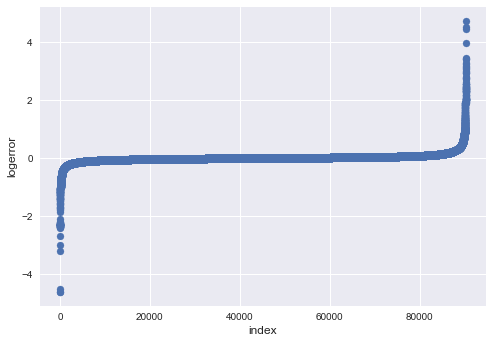

time: 1.12 s


In [12]:
plt.scatter(range(len(train_2016.logerror)), np.sort(train_2016.logerror.values))
plt.xlabel('index', fontsize=12)
plt.ylabel('logerror', fontsize=12)

### Plot distribution of target variable

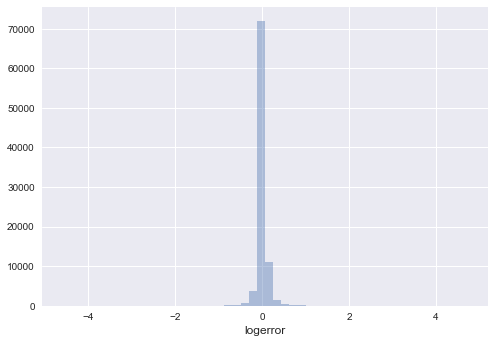

time: 342 ms


In [14]:
sns.distplot(train_2016.logerror.values, bins=50, kde=False)
plt.xlabel('logerror', fontsize=12)

### Removing outliers: setting outliers = some bound

In [18]:
ulimit = np.percentile(train_2016.logerror.values, 99)
llimit = np.percentile(train_2016.logerror.values, 1)
train_2016.loc[train_2016['logerror'] > ulimit, 'logerror'] = ulimit
train_2016.loc[train_2016['logerror'] < llimit, 'logerror'] = llimit

time: 12 ms


Select from 1 column based on condition on other column:
df.loc[condition how to select row, condition how to select cols]

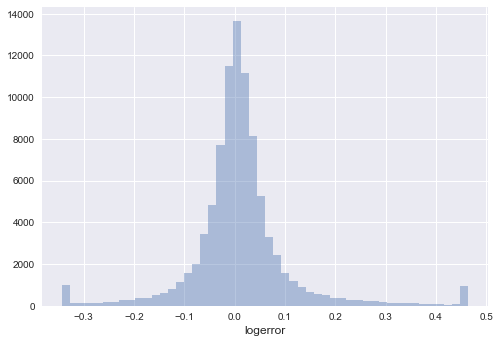

time: 374 ms


In [19]:
sns.distplot(train_2016.logerror.values, bins=50, kde=False)
plt.xlabel('logerror', fontsize=12)

In [15]:
ulimit = np.percentile(train_2016.logerror.values, 99)
llimit = np.percentile(train_2016.logerror.values, 1)
train_2016['logerror'].ix[train_2016['logerror']>ulimit] = ulimit
train_2016['logerror'].ix[train_2016['logerror']<llimit] = llimit
# What is correct way of using iloc. In R ? In SQL ? Select from 1 column based on condition on other column

time: 247 ms


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\pandas\core\indexing.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


### Not removing outliers

Most exploration is done after outliers are removed. Therefore, the remaining data points are centered around 0. Since the first round competition is to predict error, the outliers probably have more information about the signal.

Actually, I think you are not actually removing the outliers in logerror but replacing those values with the values for the 1st and 99th percentile. If, instead of train_df['logerror'].ix[train_df['logerror']>ulimit] = ulimit train_df['logerror'].ix[train_df['logerror']<llimit] = llimit you use train_df['logerror'].ix[train_df['logerror']>ulimit] = 0 train_df['logerror'].ix[train_df['logerror']<llimit] = 0 this will get rid of them

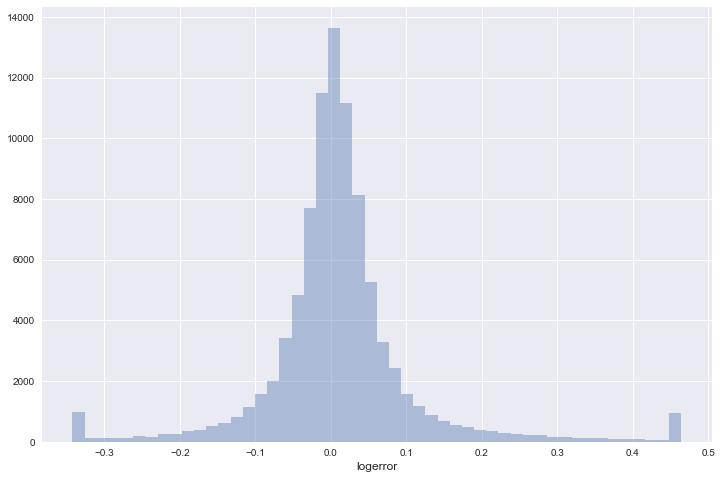

time: 412 ms


In [16]:
plt.figure(figsize=(12,8))
sns.distplot(train_2016.logerror.values, bins=50, kde=False)
plt.xlabel('logerror', fontsize=12)
plt.show()

Wow. nice normal distribution on the log error.

## Transaction Date:
Now let us explore the date field. 
### Add var - Number of transactions in each month. 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text xticklabel objects>)

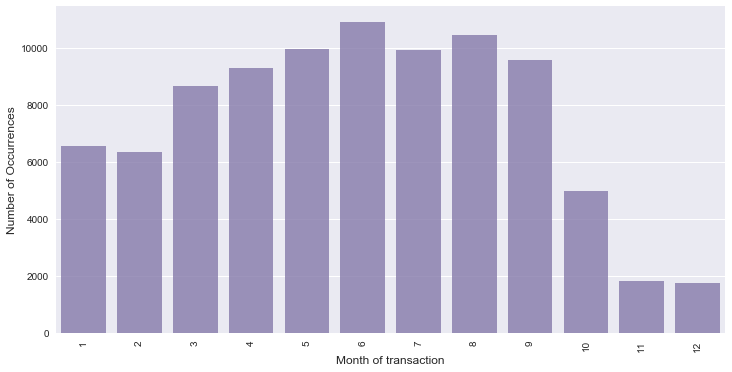

time: 509 ms


In [7]:
train_2016['transaction_month'] = train_2016['transactiondate'].astype('datetime64[ns]').dt.month

cnt_srs = train_2016['transaction_month'].value_counts()
plt.figure(figsize=(12,6))
sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.8, color=color[3])
plt.xticks(rotation='vertical')
plt.xlabel('Month of transaction', fontsize=12)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.show()

As we could see from the data page as well The train data has all the transactions before October 15, 2016, plus some of the transactions after October 15, 2016.

So we have shorter bars in the last three months.

# properties_2016.csv

Now let's explore the properties_2016 file

In [46]:
freq(properties_2016, sort = 'count')

Frequency table of each variable:


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ipykernel_launcher.py:10: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  # Remove the CWD from sys.path while we load stuff.


,12584959,12650463,12791706,12644322,12591100,12593147,12595194,12597241,12599288,12601335,...,12593157,12611598,12607500,12605451,12603402,12601353,12599304,12597255,12595206,12582912
parcelid,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


,nan,1.0,13.0,5.0,11.0,12.0,9.0,3.0
airconditioningtypeid,2173698,742364,58457,8795,1818,59,19,7


,nan,7.0,8.0,2.0,21.0,3.0,5.0,27.0,10.0
architecturalstyletypeid,2979156,5251,380,201,150,58,19,1,1


,nan,1528.0,700.0,240.0,100.0,144.0,360.0,473.0,1040.0,120.0,...,412.0,785.0,783.0,416.0,777.0,774.0,771.0,769.0,418.0,1391.0
basementsqft,2983589,25,21,21,18,16,15,12,12,12,...,1,1,1,1,1,1,1,1,1,1


,2.0,3.0,1.0,2.5,4.0,0.0,1.5,5.0,3.5,4.5,...,18.0,10.5,20.0,17.0,1.75,11.5,19.0,12.5,14.5,19.5
bathroomcnt,1218664,629351,499330,206856,132076,116614,45885,38241,30755,19017,...,15,12,10,7,5,3,3,2,1,1


,3.0,4.0,2.0,5.0,0.0,1.0,6.0,8.0,7.0,nan,...,12.0,11.0,13.0,14.0,16.0,15.0,20.0,18.0,17.0,19.0
bedroomcnt,1169462,727052,605367,181222,121466,86610,48563,13555,12744,11450,...,981,439,89,73,65,26,13,10,8,3


,nan,4.0,3.0,2.0,1.0,5.0
buildingclasstypeid,2972588,9265,3161,81,65,57


,7.0,nan,4.0,1.0,10.0,12.0,6.0,8.0,9.0,5.0,11.0,3.0,2.0
buildingqualitytypeid,1133238,1046729,692160,69467,39713,3692,94,51,25,21,19,6,2


,2.0,3.0,1.0,2.5,4.0,nan,1.5,5.0,3.5,4.5,...,15.0,18.0,10.5,20.0,17.0,19.0,11.5,12.5,19.5,14.5
calculatedbathnbr,1218652,629351,499322,206563,132076,128912,45564,38241,30669,18959,...,24,15,12,10,7,3,3,2,1,1


,nan,66.0
decktypeid,2968121,17096


,nan,1252.0,1233.0,1120.0,1226.0,1612.0,1244.0,1205.0,798.0,1441.0,...,7223.0,7233.0,7237.0,7243.0,7251.0,7298.0,7324.0,7350.0,7355.0,3941.0
finishedfloor1squarefeet,2782500,923,864,705,616,597,592,580,579,578,...,1,1,1,1,1,1,1,1,1,1


,nan,1440.0,1344.0,1200.0,960.0,1120.0,1080.0,1040.0,1248.0,1400.0,...,9221.0,9223.0,82897.0,83687.0,9237.0,9229.0,188944.0,84000.0,9230.0,12214.0
calculatedfinishedsquarefeet,55565,8946,7203,7098,6014,5918,5839,5431,5308,4735,...,1,1,1,1,1,1,1,1,1,1


,nan,1440.0,1200.0,1344.0,1120.0,960.0,1080.0,1040.0,1248.0,1400.0,...,16793.0,16514.0,27467.0,27470.0,6926.0,7221.0,84358.0,331.0,332.0,10307.0
finishedsquarefeet12,276033,6941,6636,6235,5660,5611,5611,5128,4651,4545,...,1,1,1,1,1,1,1,1,1,1


,nan,1440.0,1344.0,1248.0,1536.0,1152.0,720.0,960.0,1040.0,1200.0,...,516.0,1701.0,592.0,468.0,1586.0,1540.0,572.0,1782.0,1500.0,1690.0
finishedsquarefeet13,2977545,1571,709,453,355,245,245,228,193,185,...,1,1,1,1,1,1,1,1,1,1


,nan,1536.0,1728.0,1600.0,1440.0,1800.0,1680.0,1612.0,1872.0,1920.0,...,38667.0,38674.0,38853.0,38896.0,38991.0,39103.0,39354.0,39938.0,40200.0,512.0
finishedsquarefeet15,2794419,647,429,415,413,402,378,356,342,323,...,1,1,1,1,1,1,1,1,1,1


,nan,1252.0,1233.0,1120.0,1226.0,1612.0,1244.0,798.0,1441.0,1205.0,...,3525.0,102.0,7095.0,7849.0,7930.0,7912.0,7911.0,7889.0,7887.0,4065.0
finishedsquarefeet50,2782500,923,864,705,616,597,592,579,578,578,...,1,1,1,1,1,1,1,1,1,1


,nan,952.0,800.0,3820.0,720.0,600.0,906.0,3600.0,1750.0,864.0,...,6600.0,6557.0,6546.0,6523.0,6505.0,6431.0,6411.0,6354.0,6338.0,2722.0
finishedsquarefeet6,2963216,101,90,88,74,68,62,62,61,61,...,1,1,1,1,1,1,1,1,1,1


,6037.0,6059.0,6111.0,nan
fips,2009362,741565,222853,11437


,nan,1.0,2.0,3.0,4.0,5.0,6.0,7.0,9.0,8.0
fireplacecnt,2672580,269643,34407,7696,710,126,32,15,6,2


,2.0,3.0,1.0,4.0,nan,5.0,6.0,7.0,8.0,9.0,...,12.0,11.0,13.0,14.0,16.0,15.0,18.0,20.0,17.0,19.0
fullbathcnt,1425661,660139,544928,151004,128912,43918,17198,6409,4557,1339,...,263,204,53,45,30,23,15,10,7,4


,nan,2.0,1.0,3.0,0.0,4.0,5.0,6.0,7.0,8.0,...,14.0,15.0,17.0,16.0,19.0,24.0,20.0,21.0,18.0,25.0
garagecarcnt,2101950,660462,177579,19634,14005,8495,1705,575,266,181,...,14,9,4,3,3,2,2,2,1,1


,nan,0.0,400.0,360.0,441.0,462.0,460.0,440.0,420.0,483.0,...,3453.0,3130.0,3450.0,3014.0,3160.0,3113.0,3121.0,88.0,85.0,1665.0
garagetotalsqft,2101950,196752,33443,29703,26753,25476,23787,22717,20099,17219,...,1,1,1,1,1,1,1,1,1,1


,nan,True
hashottuborspa,2916203,69014


,nan,2.0,7.0,6.0,24.0,20.0,13.0,18.0,1.0,14.0,10.0,12.0,11.0,21.0,19.0
heatingorsystemtypeid,1178816,1156830,595453,27480,21107,3216,1342,586,262,41,39,25,16,3,1


,nan,33984600.0,33708500.0,34056700.0,34171800.0,33766300.0,33785200.0,34048000.0,34169800.0,34058000.0,...,34460739.0,34687325.0,34106779.0,34599093.0,34231037.0,33718189.0,33639685.0,33476157.0,33565997.0,33494518.0
latitude,11437,862,760,740,611,568,559,555,553,541,...,1,1,1,1,1,1,1,1,1,1


,nan,-118390000.0,-118438000.0,-118389000.0,-118252000.0,-118432000.0,-118433000.0,-118445000.0,-118435000.0,-118467000.0,...,-118011001.0,-117694380.0,-119200945.0,-118834952.0,-117627730.0,-117791907.0,-118535222.0,-118496040.0,-117581923.0,-117953201.0
longitude,11437,1718,1585,1568,1402,1371,1339,1319,1290,1266,...,1,1,1,1,1,1,1,1,1,1


,nan,6000.0,5000.0,7200.0,7000.0,6500.0,7500.0,6600.0,6300.0,5500.0,...,151965.0,151926.0,151921.0,151900.0,151894.0,151879.0,151877.0,151867.0,151866.0,131039.0
lotsizesquarefeet,276099,44730,17546,15383,11956,11624,10242,7034,6704,6174,...,1,1,1,1,1,1,1,1,1,1


,nan,1.0
poolcnt,2467683,517534


,nan,450.0,400.0,480.0,500.0,512.0,600.0,800.0,420.0,648.0,...,32.0,35.0,39.0,233.0,54.0,55.0,56.0,343.0,60.0,1142.0
poolsizesum,2957257,3179,972,917,828,826,806,744,546,524,...,1,1,1,1,1,1,1,1,1,1


,nan,1.0
pooltypeid10,2948278,36939


,nan,1.0
pooltypeid2,2953142,32075


,nan,1.0
pooltypeid7,2499758,485459


,0100,122,0101,010C,1111,34,0200,010D,1,010E,...,01MC,5011,172G,0711,2700,0404,07M,03TO,0122,121O
propertycountylandusecode,1153896,522145,247494,225410,126491,123249,104612,60503,60167,50978,...,1,1,1,1,1,1,1,1,1,1


,261.0,266.0,246.0,269.0,263.0,248.0,247.0,nan,31.0,265.0,47.0,260.0,267.0,275.0,264.0,270.0
propertylandusetypeid,2148362,481067,114888,61469,58438,40325,40022,11437,9462,9421,4314,2754,1817,1201,204,36


,nan,LAR1,LAR3,LARS,LBR1N,LAR2,LARD1.5,SCUR2,LARD2,TORR-LO,...,LRR6,LCA22-CPD*,TR1*,PSR110,SGR2-R3*,POML*,DOR15*,SGR2,LCA17500,LRRAG500*
propertyzoningdesc,1006588,275029,67105,54859,52750,48808,39895,30459,30377,26632,...,1,1,1,1,1,1,1,1,1,1


,nan,60590524.2621,60379203.3911,60590626.1021,60371371.031,60375766.011,60379201.162,60372741.001,60372766.032,60590626.225,...,60379200.1211,60379009.0012,60379108.0411,60371902.022,60590626.382,60375362.004,61110052.052,60379201.0611,60371013.002,60590631.012
rawcensustractandblock,11437,1518,1455,895,886,825,816,812,800,793,...,1,1,1,1,1,1,1,1,1,1


,12447.0,46298.0,nan,16764.0,52650.0,25218.0,54311.0,5534.0,47568.0,40227.0,...,25535.0,48211.0,37882.0,6285.0,24797.0,36078.0,27512.0,47913.0,3980.0,40633.0
regionidcity,670925,93470,62845,59802,58234,56962,54277,49074,47758,46231,...,23,23,20,19,17,12,12,7,6,5


,3101.0,1286.0,2061.0,nan
regionidcounty,2009362,741565,222853,11437


,nan,118208.0,268496.0,48570.0,27080.0,37739.0,54300.0,33183.0,34213.0,51906.0,...,762182.0,274108.0,764091.0,411726.0,764146.0,275316.0,275287.0,275855.0,764092.0,273552.0
regionidneighborhood,1828815,32267,23186,21186,18891,18645,17749,16953,16607,15660,...,7,7,6,5,4,4,3,3,3,1


,96987.0,96193.0,97118.0,97319.0,96964.0,97318.0,96368.0,96990.0,96962.0,97328.0,...,96988.0,96114.0,97185.0,96034.0,96953.0,96453.0,96313.0,96258.0,96068.0,97096.0
regionidzip,22021,21759,20612,20310,19898,19862,19761,19147,17682,17304,...,2,2,2,1,1,1,1,1,1,1


,0.0,6.0,7.0,8.0,5.0,9.0,4.0,nan,10.0,3.0,...,96.0,86.0,84.0,56.0,67.0,31.0,24.0,22.0,45.0,52.0
roomcnt,2308879,178357,156397,120227,99582,45241,42320,11475,10862,6289,...,1,1,1,1,1,1,1,1,1,1


,nan,7.0
storytypeid,2983593,1624


,nan,1.0,2.0,3.0,4.0,5.0,6.0,7.0
threequarterbathnbr,2673586,308959,2338,261,46,16,9,2


,nan,6.0,4.0,13.0,10.0,11.0
typeconstructiontypeid,2978470,6670,59,14,3,1


,1.0,nan,2.0,4.0,3.0,5.0,6.0,8.0,7.0,10.0,...,211.0,199.0,196.0,186.0,181.0,179.0,156.0,151.0,149.0,65.0
unitcnt,1780051,1007727,115652,39877,39830,588,363,178,167,97,...,1,1,1,1,1,1,1,1,1,1


,nan,240.0,200.0,300.0,180.0,288.0,360.0,280.0,120.0,400.0,...,1590.0,1592.0,1596.0,1600.0,1605.0,1610.0,1611.0,1612.0,1564.0,1416.0
yardbuildingsqft17,2904862,3190,2980,2272,1492,1443,1313,1232,1136,1119,...,1,1,1,1,1,1,1,1,1,1


,nan,120.0,100.0,240.0,160.0,144.0,80.0,200.0,180.0,96.0,...,856.0,861.0,868.0,875.0,879.0,882.0,779.0,775.0,768.0,512.0
yardbuildingsqft26,2982570,91,69,61,55,53,53,52,49,45,...,1,1,1,1,1,1,1,1,1,1


,1955.0,1950.0,1954.0,1953.0,1956.0,1964.0,nan,1951.0,1963.0,1952.0,...,1828.0,1824.0,1825.0,1879.0,1821.0,1805.0,1810.0,1807.0,1823.0,1829.0
yearbuilt,88586,76142,73307,67085,65736,64929,59928,56686,54593,54405,...,1,1,1,1,1,1,1,1,1,1


,nan,1.0,2.0,3.0,4.0,5.0,6.0,7.0,41.0,20.0,17.0,14.0,8.0
numberofstories,2303148,424186,242125,15678,58,11,4,2,1,1,1,1,1


,nan,True
fireplaceflag,2980054,5163


,nan,100000.0,102461.0,104510.0,200000.0,107401.0,101998.0,150000.0,106600.0,90000.0,...,668170.0,98558.0,611400.0,611300.0,611330.0,611332.0,63710.0,668172.0,98577.0,289583.0
structuretaxvaluedollarcnt,54982,1880,1578,1513,1418,1411,1388,1378,1316,1289,...,1,1,1,1,1,1,1,1,1,1


,nan,9.0,400000.0,350000.0,450000.0,500000.0,390000.0,420000.0,380000.0,440000.0,...,10356.0,2651103.0,2650971.0,2650928.0,2650888.0,2650778.0,2652346.0,10354.0,2650546.0,966407.0
taxvaluedollarcnt,42550,1889,1572,1511,1459,1339,1266,1263,1220,1213,...,1,1,1,1,1,1,1,1,1,1


,2015.0,nan,2014.0,2012.0,2004.0,2013.0,2003.0,2001.0,2010.0,2009.0,2005.0,2016.0,2011.0,2002.0,2000.0
assessmentyear,2972420,11439,1306,26,6,4,3,3,2,2,2,1,1,1,1


,nan,20980.0,22414.0,16275.0,19149.0,9.0,20374.0,22827.0,18332.0,29757.0,...,5479659.0,21406.0,230718.0,21435.0,230714.0,21436.0,230711.0,230710.0,21438.0,477951.0
landtaxvaluedollarcnt,67733,3804,2474,2377,2218,2172,2123,2114,2108,2103,...,1,1,1,1,1,1,1,1,1,1


,nan,345.72,1844.16,1045.88,5.02,1481.24,2623.08,2264.43,2266.14,54.28,...,27146.73,18917.06,36246.22,7098.95,7077.05,10421.85,7103.65,14921.58,7097.17,152.78
taxamount,31250,171,124,110,103,102,89,89,87,83,...,1,1,1,1,1,1,1,1,1,1


,nan,Y
taxdelinquencyflag,2928755,56462


,nan,15.0,14.0,13.0,12.0,11.0,10.0,9.0,8.0,7.0,...,91.0,94.0,97.0,0.0,84.0,86.0,87.0,88.0,96.0,82.0
taxdelinquencyyear,2928753,26068,16826,4632,3124,2350,1552,1016,501,236,...,2,2,2,2,1,1,1,1,1,1


,nan,6.03792033911e+13,6.0371371031e+13,6.0379200312e+13,6.0590626225e+13,6.0590524272e+13,6.0372766032e+13,6.0379201162e+13,6.1110072021e+13,6.0375766011e+13,...,6.03790120912e+13,6.0371133031e+13,6.0590525282e+13,6.03791081311e+13,6.03790120914e+13,6.1110075091e+13,6.0373108001e+13,6.0375512021e+13,6.0372216021e+13,6.11100020011e+13
censustractandblock,75126,1171,881,811,807,806,800,779,765,753,...,1,1,1,1,1,1,1,1,1,1


time: 8.47 s


We can see that all of the parcel ids are appearing only once in this dataset.

## Missing values

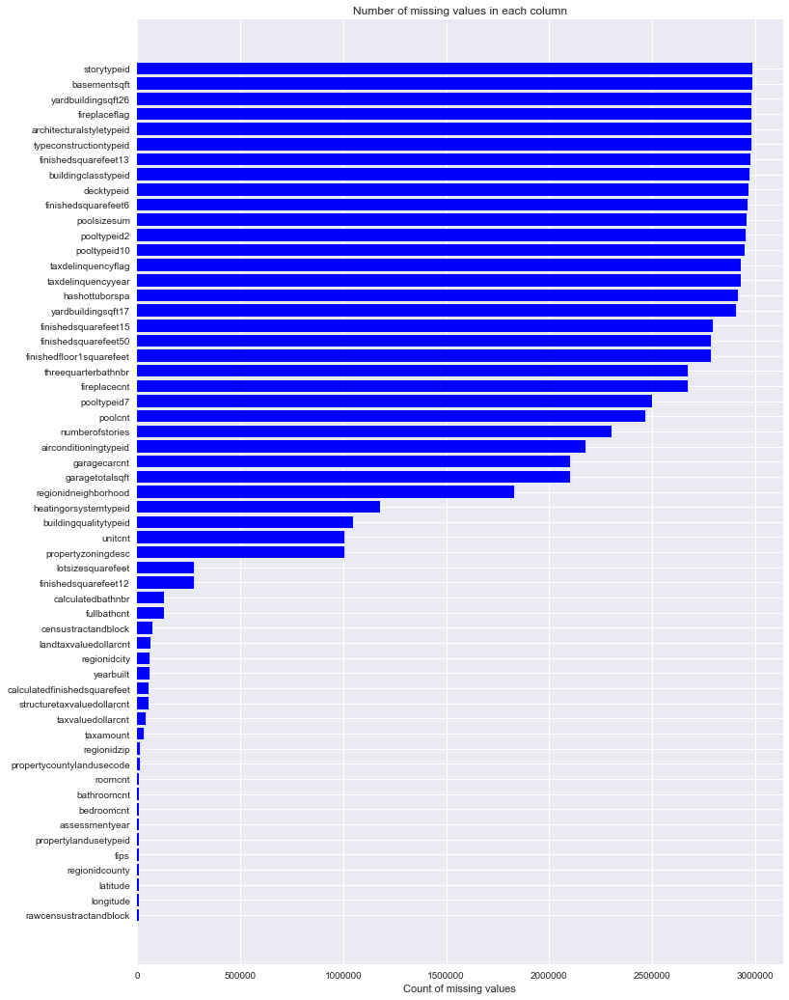

time: 2.95 s


In [12]:
missing_df = properties_2016.isnull().sum(axis=0).reset_index()
missing_df.columns = ['column_name', 'missing_count']
missing_df = missing_df.ix[missing_df['missing_count']>0]
missing_df = missing_df.sort_values(by='missing_count')

ind = np.arange(missing_df.shape[0])
width = 0.9
fig, ax = plt.subplots(figsize=(12,18))
rects = ax.barh(ind, missing_df.missing_count.values, color='blue')
ax.set_yticks(ind)
ax.set_yticklabels(missing_df.column_name.values, rotation='horizontal')
ax.set_xlabel("Count of missing values")
ax.set_title("Number of missing values in each column")
plt.show()

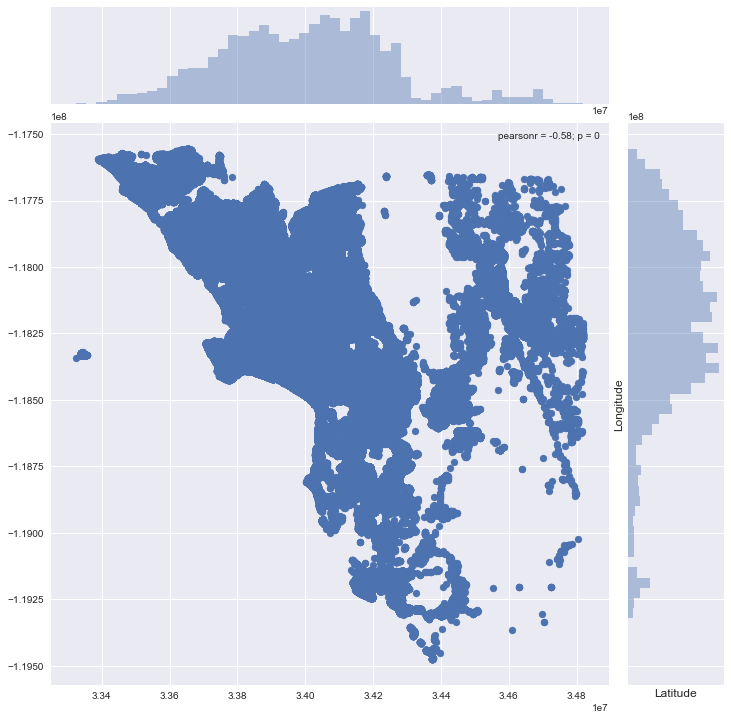

time: 30.4 s


In [7]:
plt.figure(figsize=(12,12))
sns.jointplot(x=properties_2016.latitude.values, y=properties_2016.longitude.values, size=10)
plt.ylabel('Longitude', fontsize=12)
plt.xlabel('Latitude', fontsize=12)
plt.show()

From the data page, we are provided with a full list of real estate properties in three counties (Los Angeles, Orange and Ventura, California) data in 2016.

We have about 90,811 rows in train but we have about 2,985,217 rows in properties file. So let us merge the two files and then carry out our analysis.

## Merging dataset

In [8]:
train_df = pd.merge(train_2016,properties_2016, on='parcelid', how='left')
train_df.head()

,parcelid,logerror,transactiondate,transaction_month,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,...,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock
0,11016594,0.0276,2016-01-01,1,1.0,NaN,NaN,2.0,3.0,NaN,...,NaN,NaN,122754.0,360170.0,2015.0,237416.0,6735.88,NaN,NaN,6.037107e+13
1,14366692,-0.1684,2016-01-01,1,NaN,NaN,NaN,3.5,4.0,NaN,...,NaN,NaN,346458.0,585529.0,2015.0,239071.0,10153.02,NaN,NaN,NaN
2,12098116,-0.0040,2016-01-01,1,1.0,NaN,NaN,3.0,2.0,NaN,...,NaN,NaN,61994.0,119906.0,2015.0,57912.0,11484.48,NaN,NaN,6.037464e+13
3,12643413,0.0218,2016-01-02,1,1.0,NaN,NaN,2.0,2.0,NaN,...,NaN,NaN,171518.0,244880.0,2015.0,73362.0,3048.74,NaN,NaN,6.037296e+13
4,14432541,-0.0050,2016-01-02,1,NaN,NaN,NaN,2.5,4.0,NaN,...,2.0,NaN,169574.0,434551.0,2015.0,264977.0,5488.96,NaN,NaN,6.059042e+13


time: 3.03 s


Now let us check the number of Nulls in this new merged dataset. The code show which one has missing over 99%

In [10]:
missing_df = train_df.isnull().sum(axis=0).reset_index()
missing_df.columns = ['column_name', 'missing_count']
missing_df['missing_ratio'] = missing_df['missing_count'] / train_df.shape[0]
missing_df.ix[missing_df['missing_ratio']>0.999]

,column_name,missing_count,missing_ratio
5,basementsqft,90232,0.999524
8,buildingclasstypeid,90259,0.999823
15,finishedsquarefeet13,90242,0.999634
43,storytypeid,90232,0.999524


time: 129 ms


## impute the missing values

In [ ]:
# Let us just impute the missing values with mean values to compute correlation coefficients #
mean_values = train_df.mean(axis=0)
train_df_new = train_df.fillna(mean_values, inplace=True)

## Univariate Analysis:

Since there are so many variables, let us first take the 'float' variables alone and then get the correlation with the target variable to see how they are related.

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\numpy\lib\function_base.py:2569: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\numpy\lib\function_base.py:2570: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


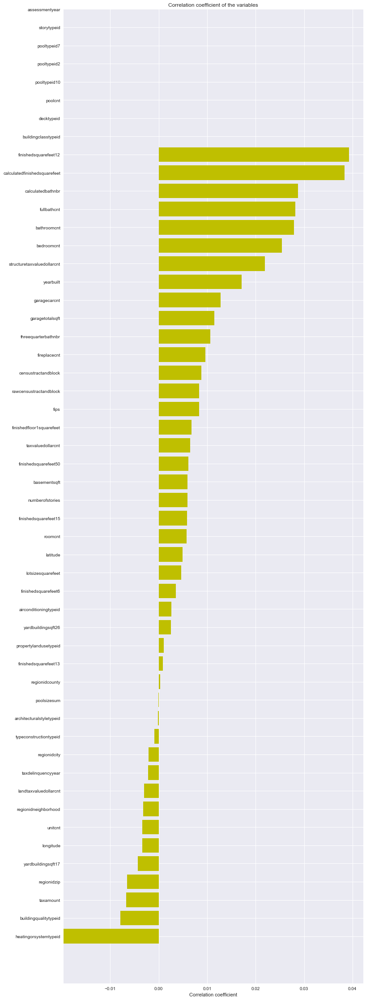

time: 11.5 s


In [11]:
# Now let us look at the correlation coefficient of each of these variables #
x_cols = [col for col in train_df_new.columns if col not in ['logerror'] if train_df_new[col].dtype=='float64']

labels = []
values = []
for col in x_cols:
    labels.append(col)
    values.append(np.corrcoef(train_df_new[col].values, train_df_new.logerror.values)[0,1])
corr_df = pd.DataFrame({'col_labels':labels, 'corr_values':values})
corr_df = corr_df.sort_values(by='corr_values')
    
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(12,40))
rects = ax.barh(ind, np.array(corr_df.corr_values.values), color='y')
ax.set_yticks(ind)
ax.set_yticklabels(corr_df.col_labels.values, rotation='horizontal')
ax.set_xlabel("Correlation coefficient")
ax.set_title("Correlation coefficient of the variables")
#autolabel(rects)
plt.show()

The correlation of the target variable with the given set of variables are low overall.

There are few variables at the top of this graph without any correlation values. I guess they have only one unique value and hence no correlation value. Let us confirm the same.

In [12]:
corr_zero_cols = ['assessmentyear', 'storytypeid', 'pooltypeid2', 'pooltypeid7', 'pooltypeid10', 'poolcnt', 'decktypeid', 'buildingclasstypeid']
for col in corr_zero_cols:
    print(col, len(train_df_new[col].unique()))

assessmentyear 1
storytypeid 1
pooltypeid2 1
pooltypeid7 1
pooltypeid10 1
poolcnt 1
decktypeid 1
buildingclasstypeid 1
time: 7 ms


Let us take the variables with high correlation values and then do some analysis on them.

In [13]:
corr_df_sel = corr_df.ix[(corr_df['corr_values']>0.02) | (corr_df['corr_values'] < -0.01)]
corr_df_sel

,col_labels,corr_values
21,heatingorsystemtypeid,-0.019648
45,structuretaxvaluedollarcnt,0.021935
4,bedroomcnt,0.025467
3,bathroomcnt,0.027889
18,fullbathcnt,0.028169
7,calculatedbathnbr,0.028758
10,calculatedfinishedsquarefeet,0.038341
11,finishedsquarefeet12,0.039248


time: 7 ms


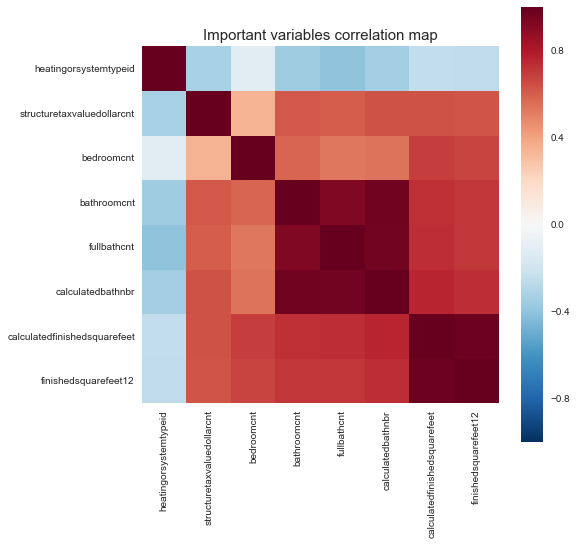

time: 988 ms


In [14]:
cols_to_use = corr_df_sel.col_labels.tolist()

temp_df = train_df[cols_to_use]
corrmat = temp_df.corr(method='spearman')
f, ax = plt.subplots(figsize=(8, 8))

# Draw the heatmap using seaborn
sns.heatmap(corrmat, vmax=1., square=True)
plt.title("Important variables correlation map", fontsize=15)
plt.show()

The important variables themselves are very highly correlated.! Let us now look at each of them.

### Finished SquareFeet 12:

Let us seee how the finished square feet 12 varies with the log error.

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\pandas\core\indexing.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


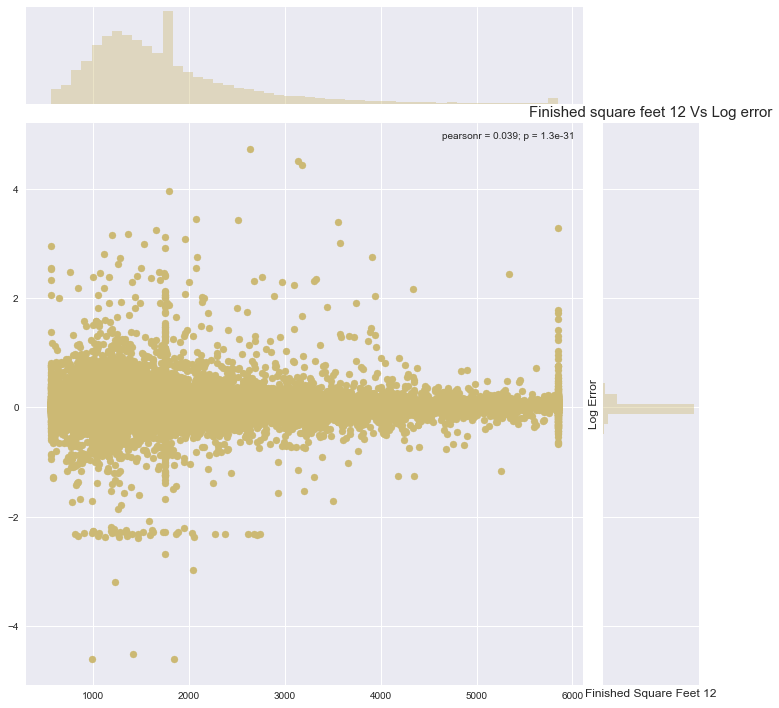

time: 1.67 s


In [15]:
col = "finishedsquarefeet12"
ulimit = np.percentile(train_df[col].values, 99.5)
llimit = np.percentile(train_df[col].values, 0.5)
train_df[col].ix[train_df[col]>ulimit] = ulimit
train_df[col].ix[train_df[col]<llimit] = llimit

plt.figure(figsize=(12,12))
sns.jointplot(x=train_df.finishedsquarefeet12.values, y=train_df.logerror.values, size=10, color=color[4])
plt.ylabel('Log Error', fontsize=12)
plt.xlabel('Finished Square Feet 12', fontsize=12)
plt.title("Finished square feet 12 Vs Log error", fontsize=15)
plt.show()

Seems the range of logerror narrows down with increase in finished square feet 12 variable. Probably larger houses are easy to predict?

### Calculated finished square feet:

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\pandas\core\indexing.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


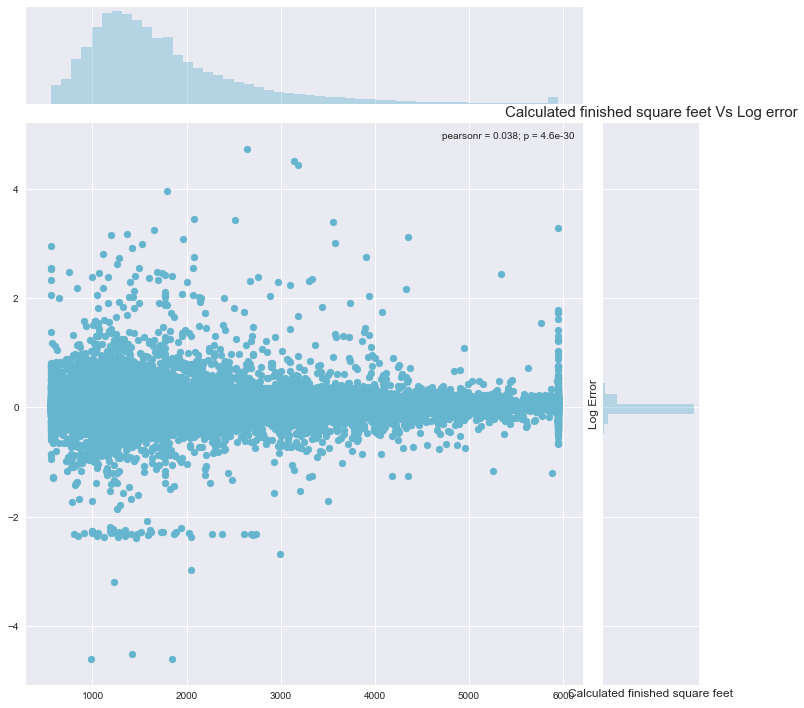

time: 1.31 s


In [16]:
col = "calculatedfinishedsquarefeet"
ulimit = np.percentile(train_df[col].values, 99.5)
llimit = np.percentile(train_df[col].values, 0.5)
train_df[col].ix[train_df[col]>ulimit] = ulimit
train_df[col].ix[train_df[col]<llimit] = llimit

plt.figure(figsize=(12,12))
sns.jointplot(x=train_df.calculatedfinishedsquarefeet.values, y=train_df.logerror.values, size=10, color=color[5])
plt.ylabel('Log Error', fontsize=12)
plt.xlabel('Calculated finished square feet', fontsize=12)
plt.title("Calculated finished square feet Vs Log error", fontsize=15)
plt.show()

Here as well the distribution is very similar to the previous one. No wonder the correlation between the two variables are also high.

### Bathroom Count:

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22]), <a list of 23 Text xticklabel objects>)

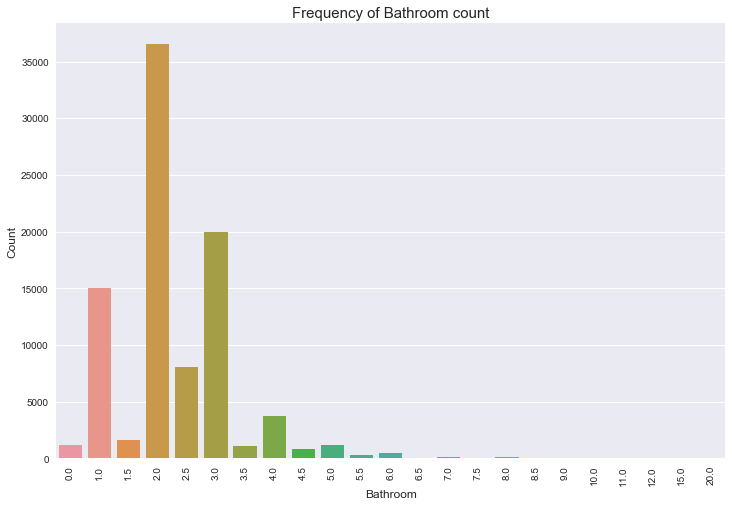

time: 223 ms


In [17]:
plt.figure(figsize=(12,8))
sns.countplot(x="bathroomcnt", data=train_df)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Bathroom', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Frequency of Bathroom count", fontsize=15)
plt.show()

There is an interesting 2.279 value in the bathroom count.

Edit: As MihwaHan pointed in the comments, this is the mean value :)

Now let us check how the log error changes based on this.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22]), <a list of 23 Text xticklabel objects>)

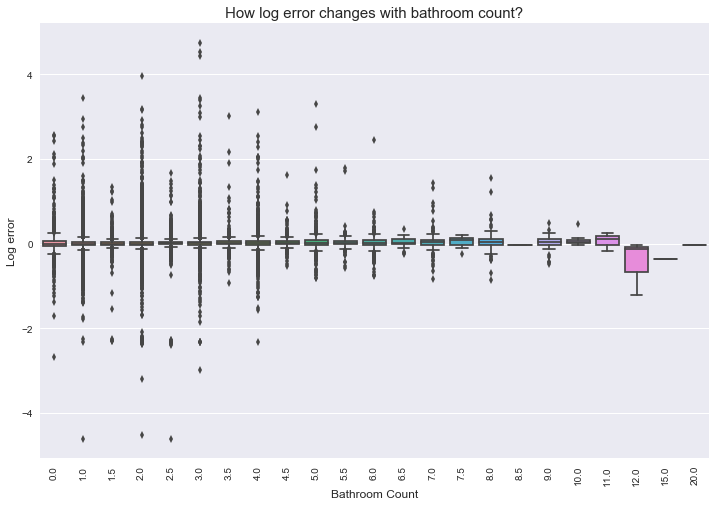

time: 1.28 s


In [18]:
plt.figure(figsize=(12,8))
sns.boxplot(x="bathroomcnt", y="logerror", data=train_df)
plt.ylabel('Log error', fontsize=12)
plt.xlabel('Bathroom Count', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("How log error changes with bathroom count?", fontsize=15)
plt.show()

### Bedroom count:

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 <a list of 17 Text xticklabel objects>)

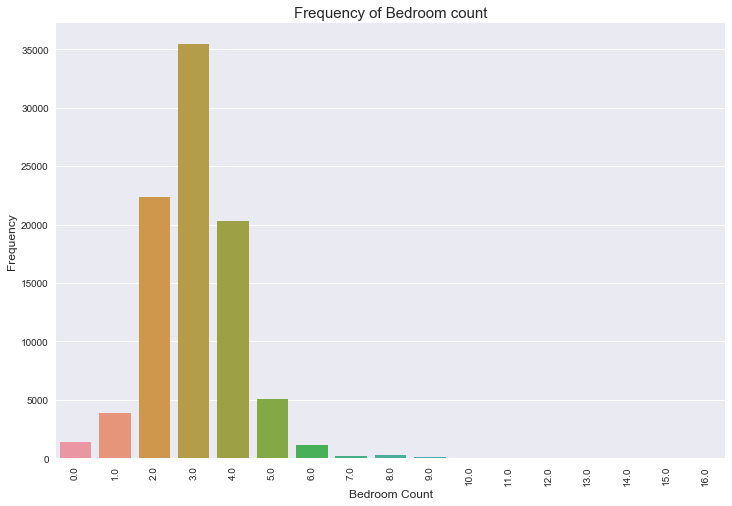

time: 189 ms


In [19]:
plt.figure(figsize=(12,8))
sns.countplot(x="bedroomcnt", data=train_df)
plt.ylabel('Frequency', fontsize=12)
plt.xlabel('Bedroom Count', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Frequency of Bedroom count", fontsize=15)
plt.show()

3.03 is the mean value with which we replaced the Null values.

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\pandas\core\indexing.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


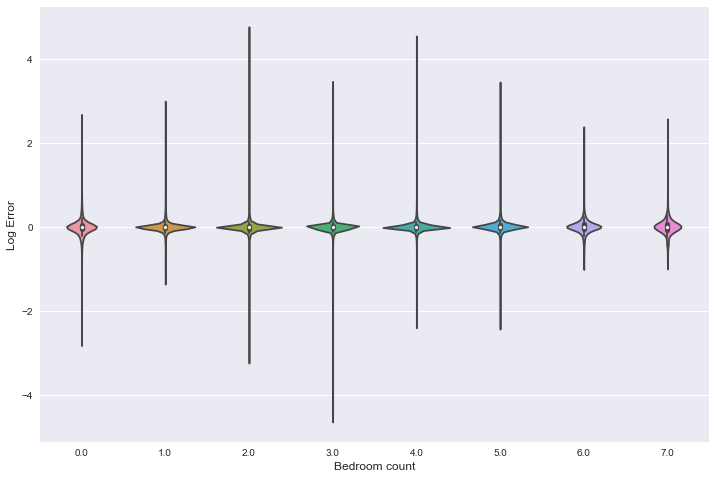

time: 772 ms


In [20]:
train_df['bedroomcnt'].ix[train_df['bedroomcnt']>7] = 7
plt.figure(figsize=(12,8))
sns.violinplot(x='bedroomcnt', y='logerror', data=train_df)
plt.xlabel('Bedroom count', fontsize=12)
plt.ylabel('Log Error', fontsize=12)
plt.show()

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\numpy\lib\function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)
D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\pandas\core\indexing.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


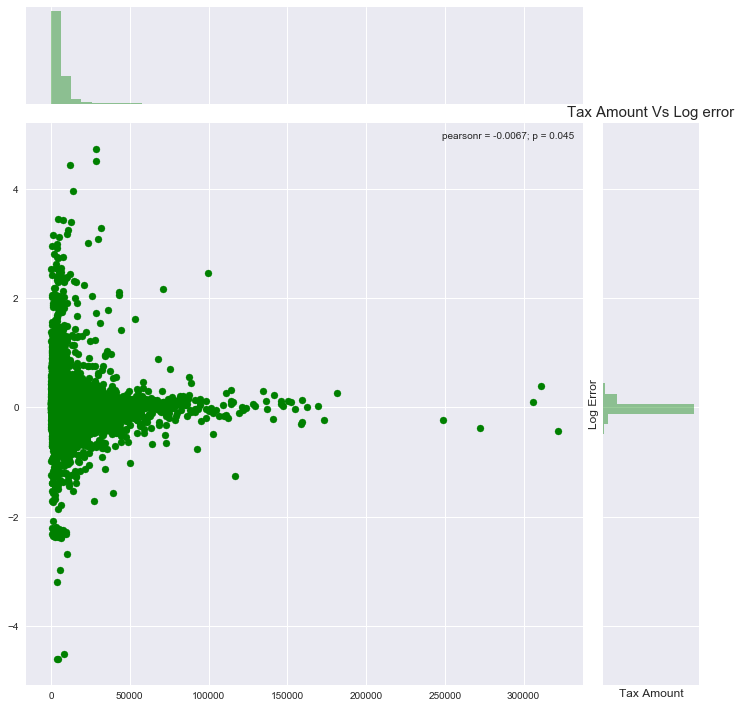

time: 2.31 s


In [11]:
col = "taxamount"
ulimit = np.percentile(train_df[col].values, 99.5)
llimit = np.percentile(train_df[col].values, 0.5)
train_df[col].ix[train_df[col]>ulimit] = ulimit
train_df[col].ix[train_df[col]<llimit] = llimit

plt.figure(figsize=(12,12))
sns.jointplot(x=train_df['taxamount'].values, y=train_df['logerror'].values, size=10, color='g')
plt.ylabel('Log Error', fontsize=12)
plt.xlabel('Tax Amount', fontsize=12)
plt.title("Tax Amount Vs Log error", fontsize=15)
plt.show()

### YearBuilt:

Let us explore how the error varies with the yearbuilt variable.

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\numpy\linalg\linalg.py:1546: RuntimeWarning: invalid value encountered in greater
  return sum(S > tol)
D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\scipy\stats\_distn_infrastructure.py:1818: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)
D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ggplot\stats\stat_smooth.py:77: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  smoothed_data = smoothed_data.sort('x')


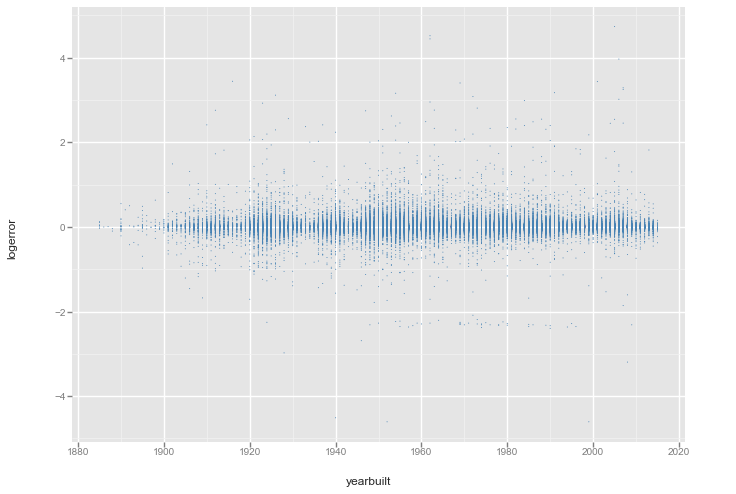

<ggplot: (-9223372036761005417)>

time: 25 s


In [12]:
from ggplot import *
ggplot(aes(x='yearbuilt', y='logerror'), data=train_df) + \
    geom_point(color='steelblue', size=1) + \
    stat_smooth()

There is a minor incremental trend seen with respect to built year.

Now let us see how the logerror varies with respect to latitude and longitude.

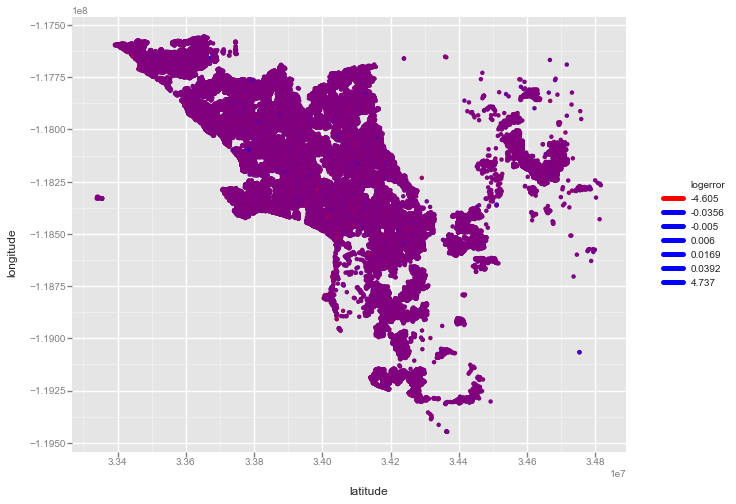

<ggplot: (-9223372036837344750)>

time: 2.5 s


In [13]:
ggplot(aes(x='latitude', y='longitude', color='logerror'), data=train_df) + \
    geom_point() + \
    scale_color_gradient(low = 'red', high = 'blue')

There are no visible pockets as such with respect to latitude or longitude atleast with the naked eye.

Let us take the variables with highest positive correlation and highest negative correlation to see if we can see some visible patterns.

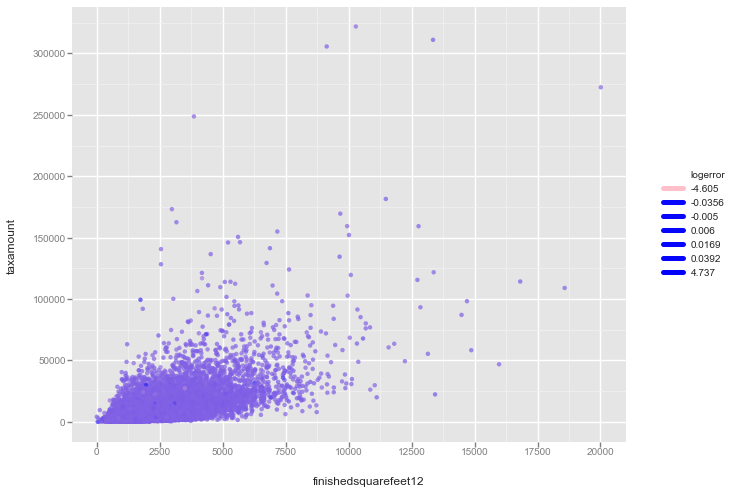

<ggplot: (-9223372036743976455)>

time: 1.43 s


In [14]:
ggplot(aes(x='finishedsquarefeet12', y='taxamount', color='logerror'), data=train_df) + \
    geom_point(alpha=0.7) + \
    scale_color_gradient(low = 'pink', high = 'blue')

There are no visible patterns here as well. So this is going to be a hard competition to predict I guess.

Just for fun, we will let the machine form some arbitrary pattern for us :D

Put a bird on it!


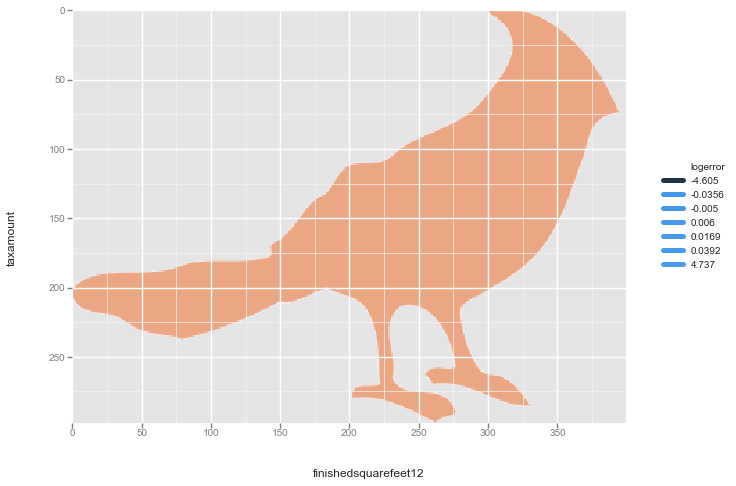

<ggplot: (93749971)>

time: 923 ms


In [15]:
ggplot(aes(x='finishedsquarefeet12', y='taxamount', color='logerror'), data=train_df) + \
    geom_now_its_art()

Hurray.! Finally we got some nice pattern in the data :P

## Features importance
We had an understanding of important variables from the univariate analysis. But this is on a stand alone basis and also we have linearity assumption. Now let us build a non-linear model to get the important variables by building Extra Trees model.

In [34]:
train_y = train_df['logerror'].values
cat_cols = ["hashottuborspa", "propertycountylandusecode", "propertyzoningdesc", "fireplaceflag", "taxdelinquencyflag"]
train_df = train_df.drop(['parcelid', 'logerror', 'transactiondate', 'transaction_month']+cat_cols, axis=1)
feat_names = train_df.columns.values

time: 56 ms


In [37]:
train_df

,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,finishedfloor1squarefeet,...,yardbuildingsqft26,yearbuilt,numberofstories,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyyear,censustractandblock
0,1.0,NaN,NaN,2.0,3.0,NaN,4.0,2.0,NaN,NaN,...,NaN,1959.0,NaN,122754.0,360170.0,2015.0,237416.0,6735.88,NaN,6.037107e+13
1,NaN,NaN,NaN,3.5,4.0,NaN,NaN,3.5,NaN,NaN,...,NaN,2014.0,NaN,346458.0,585529.0,2015.0,239071.0,10153.02,NaN,NaN
2,1.0,NaN,NaN,3.0,2.0,NaN,4.0,3.0,NaN,NaN,...,NaN,1940.0,NaN,61994.0,119906.0,2015.0,57912.0,11484.48,NaN,6.037464e+13
3,1.0,NaN,NaN,2.0,2.0,NaN,4.0,2.0,NaN,NaN,...,NaN,1987.0,NaN,171518.0,244880.0,2015.0,73362.0,3048.74,NaN,6.037296e+13
4,NaN,NaN,NaN,2.5,4.0,NaN,NaN,2.5,NaN,NaN,...,NaN,1981.0,2.0,169574.0,434551.0,2015.0,264977.0,5488.96,NaN,6.059042e+13
5,1.0,NaN,NaN,4.0,4.0,NaN,1.0,4.0,NaN,NaN,...,NaN,1982.0,NaN,880650.0,2447951.0,2015.0,1567301.0,27126.57,NaN,6.037621e+13
6,NaN,NaN,NaN,1.0,2.0,NaN,7.0,1.0,NaN,NaN,...,NaN,1939.0,NaN,64549.0,111521.0,2015.0,46972.0,2304.97,NaN,6.037542e+13
7,NaN,NaN,NaN,2.5,3.0,NaN,NaN,2.5,NaN,853.0,...,NaN,1994.0,2.0,107000.0,306000.0,2015.0,199000.0,3745.50,NaN,6.111003e+13
8,NaN,NaN,NaN,1.0,2.0,NaN,NaN,1.0,NaN,NaN,...,NaN,1984.0,NaN,66834.0,210064.0,2015.0,143230.0,2172.88,NaN,6.059042e+13
9,NaN,NaN,NaN,2.0,2.0,NaN,NaN,2.0,NaN,NaN,...,NaN,1977.0,1.0,109977.0,190960.0,2015.0,80983.0,1940.26,NaN,6.059063e+13


time: 64 ms


### ExtraTreesRegressor

In [35]:
from sklearn import ensemble
model = ensemble.ExtraTreesRegressor(n_estimators=25, max_depth=30, max_features=0.3, n_jobs=-1, random_state=0)
model.fit(train_df, train_y)

## plot the importances ##
importances = model.feature_importances_
std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0)
indices = np.argsort(importances)[::-1][:20]

plt.figure(figsize=(12,12))
plt.title("Feature importances")
plt.bar(range(len(indices)), importances[indices], color="r", yerr=std[indices], align="center")
plt.xticks(range(len(indices)), feat_names[indices], rotation='vertical')
plt.xlim([-1, len(indices)])
plt.show()

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

time: 198 ms


Seems "tax amount" is the most importanct variable followed by "structure tax value dollar count" and "land tax value dollor count"

### xgboost

In [ ]:
import xgboost as xgb
xgb_params = {
    'eta': 0.05,
    'max_depth': 8,
    'subsample': 0.7,
    'colsample_bytree': 0.7,
    'objective': 'reg:linear',
    'silent': 1,
    'seed' : 0
}
dtrain = xgb.DMatrix(train_df, train_y, feature_names=train_df.columns.values)
model = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round=50)

# plot the important features #
fig, ax = plt.subplots(figsize=(12,18))
xgb.plot_importance(model, max_num_features=50, height=0.8, ax=ax)
plt.show()

Using xgboost, the important variables are 'structured tax value dollar count' followed by 'latitude' and 'calculated finished square feet'

# Modeling


## Kernel should be read
https://www.kaggle.com/mubashir44/simple-ensemble-model-stacking

https://www.kaggle.com/mubashir44/simple-ann-implementation/code

## Reload the data

In [7]:
properties_2016 = pd.read_csv(datadir + "/properties_2016.csv")
train_2016 = pd.read_csv(datadir + "/train_2016_v2.csv")
sample_submission = pd.read_csv(datadir + "/sample_submission.csv")

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\IPython\core\interactiveshell.py:2698: DtypeWarning: Columns (22,32,34,49,55) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


time: 45.5 s


## Process the data

### Join & process data
* fill na
* label encode categorical
* left join

In [10]:
for c in properties_2016.columns:
    properties_2016[c]=properties_2016[c].fillna(-1)
    if properties_2016[c].dtype == 'object':
        lbl = LabelEncoder()
        lbl.fit(list(properties_2016[c].values))
        properties_2016[c] = lbl.transform(list(properties_2016[c].values))

df_train = train_2016.merge(properties_2016, how='left', on='parcelid')

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

time: 14.5 s


### Code explanation

In [ ]:
# Test sklearn le

In [145]:
properties_obj = properties_2016[list(properties_2016.dtypes[properties_2016.dtypes == object].index.values)]
freq(properties_obj, sort= 'count')
properties_obj.isnull().sum(axis = 0).to_frame()

Frequency table of each variable:


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ipykernel_launcher.py:16: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  app.launch_new_instance()


,nan,True
hashottuborspa,2916203,69014


,0100,122,0101,010C,1111,34,0200,010D,1,010E,...,0720,1002,1723,0310,04TO,121L,5011,070G,0403,020A
propertycountylandusecode,1153896,522145,247494,225410,126491,123249,104612,60503,60167,50978,...,1,1,1,1,1,1,1,1,1,1


,nan,LAR1,LAR3,LARS,LBR1N,LAR2,LARD1.5,SCUR2,LARD2,TORR-LO,...,SLC3-R2*,ARR3**,SGR 3YY,LCAA1*,MA M,GAMU,ARHPD1O*,DWR1*,HGC4YY,MNRI*
propertyzoningdesc,1006588,275029,67105,54859,52750,48808,39895,30459,30377,26632,...,1,1,1,1,1,1,1,1,1,1


,nan,True
fireplaceflag,2980054,5163


,nan,Y
taxdelinquencyflag,2928755,56462


,0
hashottuborspa,2916203
propertycountylandusecode,12277
propertyzoningdesc,1006588
fireplaceflag,2980054
taxdelinquencyflag,2928755


time: 2.45 s


In [89]:
df = properties_obj.sample(100)
freq(df, sort= 'count')

Frequency table of each variable:


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ipykernel_launcher.py:16: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  app.launch_new_instance()


,nan,True
hashottuborspa,99,1


,0100,122,0101,010C,34,1111,0200,010D,1222,1118,...,5050,1200,0103,012C,1,010V,0104,070P,1129,nan
propertycountylandusecode,34,20,8,8,5,3,3,3,2,2,...,1,1,1,1,1,1,1,1,1,1


,nan,LAR1,LARS,LARD2,SCUR2,PRSF*,LBR1N,LARE15,LAR3,CARS*,...,LCM1 1/2 B,POR1YY,LCR16000*,LCR175,LCR2*,LAC1.5,TORR-LO,GDR4*,WHR1YY,INR3YY
propertyzoningdesc,37,6,3,3,3,3,3,3,2,2,...,1,1,1,1,1,1,1,1,1,1


,nan
fireplaceflag,100


,nan,Y
taxdelinquencyflag,98,2


time: 224 ms


In [12]:
properties_obj.fillna(properties_obj.median(), inplace=True)
freq(properties_obj, sort= 'count')

,hashottuborspa,propertycountylandusecode,propertyzoningdesc,fireplaceflag,taxdelinquencyflag
0,NaN,010D,NaN,NaN,NaN
1,NaN,0109,LCA11*,NaN,NaN
2,NaN,1200,LAC2,NaN,NaN
3,NaN,1200,LAC2,NaN,NaN
4,NaN,1210,LAM1,NaN,NaN
5,NaN,1210,LAC4,NaN,NaN
6,NaN,010V,LAC2,NaN,NaN
7,NaN,1210,BUC4YY,NaN,NaN
8,NaN,010D,BUR1*,NaN,NaN
9,NaN,1210,SFC2*,NaN,NaN


Frequency table of each variable:


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ipykernel_launcher.py:16: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  app.launch_new_instance()


,nan,True
hashottuborspa,2916203,69014


,0100,122,0101,010C,1111,34,0200,010D,1,010E,...,02G0,1205,103,070V,121L,8830,071P,121*,7301,1181
propertycountylandusecode,1153896,522145,247494,225410,126491,123249,104612,60503,60167,50978,...,1,1,1,1,1,1,1,1,1,1


,nan,LAR1,LAR3,LARS,LBR1N,LAR2,LARD1.5,SCUR2,LARD2,TORR-LO,...,EMRY,R-1R*,LOR1P-CG*,CAMU&CS-RS,PDRL-20000,MPR3-R1*,RMR2Y,RPRS2OOOO&,SDMOG*,PSR3*
propertyzoningdesc,1006588,275029,67105,54859,52750,48808,39895,30459,30377,26632,...,1,1,1,1,1,1,1,1,1,1


,nan,True
fireplaceflag,2980054,5163


,nan,Y
taxdelinquencyflag,2928755,56462


time: 13.2 s


.fillna() doesn't fill NA (doesnt do anything) in categorical variable. 

In [13]:
list(properties_obj.median())

[]

time: 12 s


empty list

In [14]:
for c in properties_obj.dtypes[properties_obj.dtypes == object].index.values:
    properties_obj[c] = (properties_obj[c] == True) # --> only values 'True' is assigned as 'True', the rest assigned as False
properties_obj
freq(properties_obj, sort= 'count')

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,hashottuborspa,propertycountylandusecode,propertyzoningdesc,fireplaceflag,taxdelinquencyflag
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False
5,False,False,False,False,False
6,False,False,False,False,False
7,False,False,False,False,False
8,False,False,False,False,False
9,False,False,False,False,False


Frequency table of each variable:


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ipykernel_launcher.py:16: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  app.launch_new_instance()


,False,True
hashottuborspa,2916203,69014


,False
propertycountylandusecode,2985217


,False
propertyzoningdesc,2985217


,False,True
fireplaceflag,2980054,5163


,False
taxdelinquencyflag,2985217


time: 2.89 s


--> only values 'True' is assigned as 'True', the rest assigned as False

In [120]:
for c in df.columns:
    df[c]=df[c].fillna(-1)
    lbl = LabelEncoder()
    lbl.fit(list(df[c].values))
    df[c] = lbl.transform(list(df[c].values))
freq(df, sort= 'value')

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

Frequency table of each variable:


hashottuborspa,0,1
Count,95,5


propertycountylandusecode,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
Count,38,8,1,10,2,4,1,1,2,4,6,1,2,19,1


propertyzoningdesc,0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
Count,36,1,1,1,1,1,2,1,10,1,...,1,1,1,1,2,1,1,1,1,1


fireplaceflag,0
Count,100


taxdelinquencyflag,0
Count,100


time: 82 ms


In [34]:
for c in properties_sample.columns:
    properties_sample[c]=properties_sample[c].fillna(-1)
    lbl = LabelEncoder()
    lbl.fit(list(properties_sample[c].values))
    properties_sample[c] = lbl.transform(list(properties_sample[c].values))
freq(properties_sample, sort= 'count')
properties_sample

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

Frequency table of each variable:


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\ipykernel_launcher.py:16: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  app.launch_new_instance()


,0,1
hashottuborspa,98,2


,0,12,1,2,8,7,6,3,14,13,10,9,11,5,4
propertycountylandusecode,37,23,9,8,3,3,3,3,2,2,2,2,1,1,1


,0,8,40,9,15,19,51,49,39,36,...,10,21,48,7,6,5,4,3,1,25
propertyzoningdesc,36,8,2,2,2,2,2,2,1,1,...,1,1,1,1,1,1,1,1,1,1


,0
fireplaceflag,100


,0,1
taxdelinquencyflag,99,1


,hashottuborspa,propertycountylandusecode,propertyzoningdesc,fireplaceflag,taxdelinquencyflag
2686060,0,0,45,0,0
27395,0,12,0,0,0
2832588,0,0,7,0,0
2233044,0,0,18,0,0
1893365,0,0,8,0,0
2588624,0,3,10,0,0
1944255,0,12,0,0,0
2682667,0,5,9,0,0
970880,0,6,44,0,0
1454817,0,12,0,0,0


time: 121 ms


--> le also doesnt work with Nan values

In [22]:
for c in properties_obj.columns:
    properties_obj[c] = lbl.transform(list(properties_obj[c].values))
freq(properties_obj, sort= 'count')

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\numpy\lib\arraysetops.py:375: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask &= (ar1 != a)


ValueError: y contains new labels: [-1  1]

time: 634 ms


label encoding: u dont need to worry if there are new labels. The notebook will raise error:
    ValueError: y contains new labels: [-1  1]

## Creating additional features

https://www.kaggle.com/nikunjm88/creating-additional-features

### additional features related to the property

In [ ]:
#life of property
df_train['N-life'] = 2018 - df_train['yearbuilt']

#error in calculation of the finished living area of home
df_train['N-LivingAreaError'] = df_train['calculatedfinishedsquarefeet']/df_train['finishedsquarefeet12']

#proportion of living area
df_train['N-LivingAreaProp'] = df_train['calculatedfinishedsquarefeet']/df_train['lotsizesquarefeet']
df_train['N-LivingAreaProp2'] = df_train['finishedsquarefeet12']/df_train['finishedsquarefeet15']

#Amout of extra space
df_train['N-ExtraSpace'] = df_train['lotsizesquarefeet'] - df_train['calculatedfinishedsquarefeet'] 
df_train['N-ExtraSpace-2'] = df_train['finishedsquarefeet15'] - df_train['finishedsquarefeet12'] 

#Total number of rooms
df_train['N-TotalRooms'] = df_train['bathroomcnt']*df_train['bedroomcnt']

#Average room size
df_train['N-AvRoomSize'] = df_train['calculatedfinishedsquarefeet']/df_train['roomcnt'] 

# Number of Extra rooms
df_train['N-ExtraRooms'] = df_train['roomcnt'] - df_train['N-TotalRooms'] 

#Ratio of the built structure value to land area
df_train['N-ValueProp'] = df_train['structuretaxvaluedollarcnt']/df_train['landtaxvaluedollarcnt']

#Does property have a garage, pool or hot tub and AC?
df_train['N-GarPoolAC'] = ((df_train['garagecarcnt']>0) & (df_train['pooltypeid10']>0) & (df_train['airconditioningtypeid']!=5))*1 

df_train["N-location"] = df_train["latitude"] + df_train["longitude"]
df_train["N-location-2"] = df_train["latitude"]*df_train["longitude"]
df_train["N-location-2round"] = df_train["N-location-2"].round(-4)

df_train["N-latitude-round"] = df_train["latitude"].round(-4)
df_train["N-longitude-round"] = df_train["longitude"].round(-4)

### additional features based off the tax related variables

In [ ]:
#Ratio of tax of property over parcel
df_train['N-ValueRatio'] = df_train['taxvaluedollarcnt']/df_train['taxamount']

#TotalTaxScore
df_train['N-TaxScore'] = df_train['taxvaluedollarcnt']*df_train['taxamount']

#polnomials of tax delinquency year
df_train["N-taxdelinquencyyear-2"] = df_train["taxdelinquencyyear"] ** 2
df_train["N-taxdelinquencyyear-3"] = df_train["taxdelinquencyyear"] ** 3

#Length of time since unpaid taxes
df_train['N-life'] = 2018 - df_train['taxdelinquencyyear']

### features based off the location

In [ ]:
#Number of properties in the zip
zip_count = df_train['regionidzip'].value_counts().to_dict()
df_train['N-zip_count'] = df_train['regionidzip'].map(zip_count)

#Number of properties in the city
city_count = df_train['regionidcity'].value_counts().to_dict()
df_train['N-city_count'] = df_train['regionidcity'].map(city_count)

#Number of properties in the city
region_count = df_train['regionidcounty'].value_counts().to_dict()
df_train['N-county_count'] = df_train['regionidcounty'].map(city_count)

###  additional variables which are simplification of some of the other variables

In [ ]:
#Indicator whether it has AC or not
df_train['N-ACInd'] = (df_train['airconditioningtypeid']!=5)*1

#Indicator whether it has Heating or not 
df_train['N-HeatInd'] = (df_train['heatingorsystemtypeid']!=13)*1

#There's 25 different property uses - let's compress them down to 4 categories
df_train['N-PropType'] = df_train.propertylandusetypeid.replace({31 : "Mixed", 46 : "Other", 47 : "Mixed", 246 : "Mixed", 247 : "Mixed", 248 : "Mixed", 260 : "Home", 261 : "Home", 262 : "Home", 263 : "Home", 264 : "Home", 265 : "Home", 266 : "Home", 267 : "Home", 268 : "Home", 269 : "Not Built", 270 : "Home", 271 : "Home", 273 : "Home", 274 : "Other", 275 : "Home", 276 : "Home", 279 : "Home", 290 : "Not Built", 291 : "Not Built" })

### One of the EDA kernels indicated that structuretaxvaluedollarcnt was one of the most important features. So let's create some additional variables on that.

In [ ]:
#polnomials of the variable
df_train["N-structuretaxvaluedollarcnt-2"] = df_train["structuretaxvaluedollarcnt"] ** 2
df_train["N-structuretaxvaluedollarcnt-3"] = df_train["structuretaxvaluedollarcnt"] ** 3

#Average structuretaxvaluedollarcnt by city
group = df_train.groupby('regionidcity')['structuretaxvaluedollarcnt'].aggregate('mean').to_dict()
df_train['N-Avg-structuretaxvaluedollarcnt'] = df_train['regionidcity'].map(group)

#Deviation away from average
df_train['N-Dev-structuretaxvaluedollarcnt'] = abs((df_train['structuretaxvaluedollarcnt'] - df_train['N-Avg-structuretaxvaluedollarcnt']))/df_train['N-Avg-structuretaxvaluedollarcnt']

### XGBoost to assess importance

In [ ]:
train_y = df_train['logerror'].values
df_train = df_train.drop(['parcelid', 'logerror', 'transactiondate', 'propertyzoningdesc', 'propertycountylandusecode'], axis=1)
feat_names = df_train.columns.values

for c in df_train.columns:
    if df_train[c].dtype == 'object':
        lbl = LabelEncoder()
        lbl.fit(list(df_train[c].values))
        df_train[c] = lbl.transform(list(df_train[c].values))

#import xgboost as xgb
xgb_params = {
    'eta': 0.05,
    'max_depth': 8,
    'subsample': 0.7,
    'colsample_bytree': 0.7,
    'objective': 'reg:linear',
    'silent': 1,
    'seed' : 0
}
dtrain = xgb.DMatrix(df_train, train_y, feature_names=df_train.columns.values)
model = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round=150)

# plot the important features #
fig, ax = plt.subplots(figsize=(12,18))
xgb.plot_importance(model, max_num_features=50, height=0.8, ax=ax)
plt.show()

## Light GBM
with outliers

https://www.kaggle.com/aharless/xgb-w-o-outliers-lgb-with-outliers-combined/code<br>
Parameters
XGB_WEIGHT = 0.6500
BASELINE_WEIGHT = 0.0056
BASELINE_PRED = 0.0115

Baseline taken from https://www.kaggle.com/aharless/oleg-s-original-better-baseline

There are three methods within this code:

Simple mean - 0.0652995
Brute force - 0.0656439
Month-specific brute force - 0.0653038

Update: 
* https://www.kaggle.com/aharless/xgboost-lightgbm-and-ols
* https://www.kaggle.com/aharless/xgboost-using-4th-quarter-for-validation

Another same one with a bit improvement: <br> 
https://www.kaggle.com/davidfumo/boosted-trees-lb-0-0643707/code<br>
Parameters
XGB_WEIGHT = 0.6415
BASELINE_WEIGHT = 0.0056
OLS_WEIGHT = 0.0828

XGB1_WEIGHT = 0.8083  # Weight of first in combination of two XGB models
BASELINE_PRED = 0.0115   # Baseline based on mean of training data, per Oleg

### PROCESS DATA FOR LIGHTGBM
* merge left : df_train
* fill na: median
* drop column ['parcelid', 'logerror','transactiondate', 'propertyzoningdesc',               'propertycountylandusecode', 'fireplacecnt', 'fireplaceflag'], create target: x,y train test
* fill na: categorical var --> true/false
* xtrain --> np.float32 (for faster ?)

In [9]:
# https://www.kaggle.com/aharless/xgb-w-o-outliers-lgb-with-outliers-combined/code
### RE-READ data FILE
properties_2016 = pd.read_csv(datadir + "/properties_2016.csv")
train_2016 = pd.read_csv(datadir + "/train_2016_v2.csv")
sample_submission = pd.read_csv(datadir + "/sample_submission.csv")
from sklearn.preprocessing import LabelEncoder
for c, dtype in zip(properties_2016.columns, properties_2016.dtypes):
    if dtype == np.float64:
        properties_2016[c] = properties_2016[c].astype(np.float32)

df_train = train_2016.merge(properties_2016, how='left', on='parcelid')
df_train.fillna(df_train.median(),inplace = True) 

x_train = df_train.drop(['parcelid', 'logerror', 'transactiondate', 'propertyzoningdesc', 
                         'propertycountylandusecode', 'fireplacecnt', 'fireplaceflag'], axis=1)
y_train = df_train['logerror'].values
print(x_train.shape, y_train.shape)


train_columns = x_train.columns

for c in x_train.dtypes[x_train.dtypes == object].index.values:
    x_train[c] = (x_train[c] == True)

del df_train; gc.collect()

x_train = x_train.values.astype(np.float32, copy=False)


D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\IPython\core\interactiveshell.py:2698: DtypeWarning: Columns (22,32,34,49,55) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,parcelid,logerror,transactiondate,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,...,numberofstories,fireplaceflag,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock
0,11016594,0.0276,2016-01-01,1.0,7.0,616.0,2.0,3.0,4.0,4.0,...,1.0,1,122754.0,360170.0,2015.0,237416.0,6735.879883,NaN,14.0,6.037107e+13
1,14366692,-0.1684,2016-01-01,1.0,7.0,616.0,3.5,4.0,4.0,7.0,...,1.0,1,346458.0,585529.0,2015.0,239071.0,10153.019531,NaN,14.0,6.037615e+13
2,12098116,-0.0040,2016-01-01,1.0,7.0,616.0,3.0,2.0,4.0,4.0,...,1.0,1,61994.0,119906.0,2015.0,57912.0,11484.480469,NaN,14.0,6.037464e+13
3,12643413,0.0218,2016-01-02,1.0,7.0,616.0,2.0,2.0,4.0,4.0,...,1.0,1,171518.0,244880.0,2015.0,73362.0,3048.739990,NaN,14.0,6.037296e+13
4,14432541,-0.0050,2016-01-02,1.0,7.0,616.0,2.5,4.0,4.0,7.0,...,2.0,1,169574.0,434551.0,2015.0,264977.0,5488.959961,NaN,14.0,6.059042e+13
5,11509835,-0.2705,2016-01-02,1.0,7.0,616.0,4.0,4.0,4.0,1.0,...,1.0,1,880650.0,2447951.0,2015.0,1567301.0,27126.570312,NaN,14.0,6.037621e+13
6,12286022,0.0440,2016-01-02,1.0,7.0,616.0,1.0,2.0,4.0,7.0,...,1.0,1,64549.0,111521.0,2015.0,46972.0,2304.969971,NaN,14.0,6.037542e+13
7,17177301,0.1638,2016-01-02,1.0,7.0,616.0,2.5,3.0,4.0,7.0,...,2.0,1,107000.0,306000.0,2015.0,199000.0,3745.500000,NaN,14.0,6.111003e+13
8,14739064,-0.0030,2016-01-02,1.0,7.0,616.0,1.0,2.0,4.0,7.0,...,1.0,1,66834.0,210064.0,2015.0,143230.0,2172.879883,NaN,14.0,6.059042e+13
9,14677559,0.0843,2016-01-03,1.0,7.0,616.0,2.0,2.0,4.0,7.0,...,1.0,1,109977.0,190960.0,2015.0,80983.0,1940.260010,NaN,14.0,6.059063e+13


(90275, 53) (90275,)


417

NameError: name 'lgb' is not defined

time: 1min 9s


In [ ]:
This version doesnt use label encoding

### RUN LIGHTGBM

In [11]:
# https://www.kaggle.com/aharless/xgb-w-o-outliers-lgb-with-outliers-combined/code
import lightgbm as lgb
d_train = lgb.Dataset(x_train, label=y_train)
params = {}
params['max_bin'] = 10
params['learning_rate'] = 0.0021 # shrinkage_rate
params['boosting_type'] = 'gbdt'
params['objective'] = 'regression'
params['metric'] = 'l1'          # or 'mae'
params['sub_feature'] = 0.5      # feature_fraction -- OK, back to .5, but maybe later increase this
params['bagging_fraction'] = 0.85 # sub_row
params['bagging_freq'] = 40
params['num_leaves'] = 512        # num_leaf
params['min_data'] = 500         # min_data_in_leaf
params['min_hessian'] = 0.05     # min_sum_hessian_in_leaf
params['verbose'] = 0

print("\nFitting LightGBM model ...")
clf = lgb.train(params, d_train, 430)

del d_train; gc.collect()
del x_train; gc.collect()

print("\nPrepare for LightGBM prediction ...")

sample_submission['parcelid'] = sample_submission['ParcelId']
print("   Merge with property data ...")
df_test = sample_submission.merge(properties_2016, on='parcelid', how='left')
print("   ...")
del sample_submission, properties_2016; gc.collect()
print("   ...")
x_test = df_test[train_columns]
print("   ...")
del df_test; gc.collect()
print("   Preparing x_test...")
for c in x_test.dtypes[x_test.dtypes == object].index.values: # !!!! Idk what does this shit do ?
    x_test[c] = (x_test[c] == True)
print("   ...")
x_test = x_test.values.astype(np.float32, copy=False)

print("\nStart LightGBM prediction ...")
# num_threads > 1 will predict very slow in kernal
clf.reset_parameter({"num_threads":1})
p_test = clf.predict(x_test)

del x_test; gc.collect()

print( "\nUnadjusted LightGBM predictions:" )
print( pd.DataFrame(p_test).head() )


Fitting LightGBM model ...


427

0


Prepare for LightGBM prediction ...
   Merge with property data ...
   ...


559

   ...
   ...


21

   Preparing x_test...
   ...

Start LightGBM prediction ...


7


Unadjusted LightGBM predictions:
          0
0  0.043827
1  0.045404
2  0.027415
3  0.022098
4  0.014157
time: 3min 22s


## XGBoost
w-o outliers

### PROCESS DATA FOR XGBOOST
* fill na
* label encoding properties file
* merge : train_df
* drop outliers: train_df
* drop column ['parcelid', 'logerror','transactiondate'], create target: x,y train test


In [14]:
# https://www.kaggle.com/aharless/xgb-w-o-outliers-lgb-with-outliers-combined/code
### RE-READ data FILE
properties_2016 = pd.read_csv(datadir + "/properties_2016.csv")
train_2016 = pd.read_csv(datadir + "/train_2016_v2.csv")
sample_submission = pd.read_csv(datadir + "/sample_submission.csv")

from sklearn.preprocessing import LabelEncoder

print( "\nProcessing data for XGBoost ...")
for c in properties_2016.columns:
    properties_2016[c]=properties_2016[c].fillna(-1)
    if properties_2016[c].dtype == 'object':
        lbl = LabelEncoder()
        lbl.fit(list(properties_2016[c].values))
        properties_2016[c] = lbl.transform(list(properties_2016[c].values))

train_df = train_2016.merge(properties_2016, how='left', on='parcelid')
x_train = train_df.drop(['parcelid', 'logerror','transactiondate'], axis=1)
x_test = properties_2016.drop(['parcelid'], axis=1)
# shape        
print('Shape train: {}\nShape test: {}'.format(x_train.shape, x_test.shape))

# drop out ouliers
train_df=train_df[ train_df.logerror > -0.4 ]
train_df=train_df[ train_df.logerror < 0.418 ]
x_train=train_df.drop(['parcelid', 'logerror','transactiondate'], axis=1)
y_train = train_df["logerror"].values.astype(np.float32)
y_mean = np.mean(y_train) # --> for sgb parameters

print('After removing outliers:')     
print('Shape train: {}\nShape test: {}'.format(x_train.shape, x_test.shape))

D:\WinPython-64bit-3.6.1.0Qt5\python-3.6.1.amd64\lib\site-packages\IPython\core\interactiveshell.py:2698: DtypeWarning: Columns (22,32,34,49,55) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)



Processing data for XGBoost ...


LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

Shape train: (90275, 57)
Shape test: (2985217, 57)
After removing outliers:
Shape train: (88525, 57)
Shape test: (2985217, 57)
time: 1min 2s


In [ ]:
Now what he did is correct. Label encoding the properties file and then merge

### RUN XGBOOST

https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/

In [15]:
# https://www.kaggle.com/aharless/xgb-w-o-outliers-lgb-with-outliers-combined/code
import xgboost as xgb
print("\nSetting up data for XGBoost ...")
# xgboost params
xgb_params = {
    'eta': 0.037,
    'max_depth': 5,
    'subsample': 0.80,
    'objective': 'reg:linear',
    'eval_metric': 'mae',
    'lambda': 0.8,   
    'alpha': 0.4, 
    'base_score': y_mean,
    'silent': 1
}
# Enough with the ridiculously overfit parameters.
# I'm going back to my version 20 instead of copying Jayaraman.
# I want a num_boost_rounds that's chosen by my CV,
# not one that's chosen by overfitting the public leaderboard.
# (There may be underlying differences between the train and test data
#  that will affect some parameters, but they shouldn't affect that.)

dtrain = xgb.DMatrix(x_train, y_train)
dtest = xgb.DMatrix(x_test)

# cross-validation
#print( "Running XGBoost CV ..." )
#cv_result = xgb.cv(xgb_params, 
#                   dtrain, 
#                   nfold=5,
#                   num_boost_round=350,
#                   early_stopping_rounds=50,
#                   verbose_eval=10, 
#                   show_stdv=False
#                  )
#num_boost_rounds = len(cv_result)

# num_boost_rounds = 150
num_boost_rounds = 242
print("\nXGBoost tuned with CV in:")
print("   https://www.kaggle.com/aharless/xgboost-without-outliers-tweak ")
print("num_boost_rounds="+str(num_boost_rounds))

# train model
print( "\nTraining XGBoost ...")
model = xgb.train(dict(xgb_params, silent=1), dtrain, num_boost_round=num_boost_rounds)

print( "\nPredicting with XGBoost ...")
xgb_pred = model.predict(dtest)

print( "\nXGBoost predictions:" )
print( pd.DataFrame(xgb_pred).head() )


Setting up data for XGBoost ...

XGBoost tuned with CV in:
   https://www.kaggle.com/aharless/xgboost-without-outliers-tweak 
num_boost_rounds=242

Training XGBoost ...

Predicting with XGBoost ...

XGBoost predictions:
          0
0 -0.033079
1 -0.029117
2  0.038863
3  0.073058
4 -0.000925
time: 36.1 s


## COMBINE PREDICTIONS

In [16]:
# https://www.kaggle.com/aharless/xgb-w-o-outliers-lgb-with-outliers-combined/code
# Parameters
XGB_WEIGHT = 0.6500
BASELINE_WEIGHT = 0.0056

BASELINE_PRED = 0.0115
print( "\nCombining XGBoost, LightGBM, and baseline predicitons ..." )
lgb_weight = 1 - XGB_WEIGHT - BASELINE_WEIGHT
pred = XGB_WEIGHT*xgb_pred + BASELINE_WEIGHT*BASELINE_PRED + lgb_weight*p_test

print( "\nCombined predictions:" )
print( pd.DataFrame(pred).head() )


Combining XGBoost, LightGBM, and baseline predicitons ...


NameError: name 'XGB_WEIGHT' is not defined

time: 20.5 ms


## WRITE THE RESULTS

In [ ]:
# https://www.kaggle.com/aharless/xgb-w-o-outliers-lgb-with-outliers-combined/code
print( "\nPreparing results for write ..." )
y_pred=[]

for i,predict in enumerate(pred):
    y_pred.append(str(round(predict,4)))
y_pred=np.array(y_pred)

output = pd.DataFrame({'ParcelId': properties['parcelid'].astype(np.int32),
        '201610': y_pred, '201611': y_pred, '201612': y_pred,
        '201710': y_pred, '201711': y_pred, '201712': y_pred})  # it seems that all month has the same value
# set col 'ParceID' to first col
cols = output.columns.tolist()
cols = cols[-1:] + cols[:-1]
output = output[cols]
from datetime import datetime

print( "\nWriting results to disk ..." )
output.to_csv('sub{}.csv'.format(datetime.now().strftime('%Y%m%d_%H%M%S')), index=False)

print( "\nFinished ..." )

## Genetic Programming
https://www.kaggle.com/scirpus/genetic-programming-lb-0-0643904

This projects highcardinality parameters onto the median first then uses Genetic Programming to predict the outputs. I suggest you use XGB or any other favourite predictor - there is nothing stopping you adding some of the GP features to your models though.

In [ ]:
def ProjectOnMedian(data1, data2, columnName):
    grpOutcomes = data1.groupby(list([columnName]))['y'].median().reset_index()
    grpCount = data1.groupby(list([columnName]))['y'].count().reset_index()
    grpOutcomes['cnt'] = grpCount.y
    grpOutcomes.drop('cnt', inplace=True, axis=1)
    outcomes = data2['y'].values
    x = pd.merge(data2[[columnName, 'y']], grpOutcomes,
                 suffixes=('x_', ''),
                 how='left',
                 on=list([columnName]),
                 left_index=True)['y']

    
    return x.values

In [ ]:
properties = pd.read_csv(datadir + "/properties_2016.csv")
properties.hashottuborspa = properties.hashottuborspa.astype(str)
properties.fireplaceflag = properties.fireplaceflag.astype(str)
for c in properties.columns:
    if properties[c].dtype == 'object':
        print(c)
        lbl = LabelEncoder()
        lbl.fit(list(properties[c].values))
        properties[c] = lbl.transform(list(properties[c].values))

In [ ]:
highcardinality = ['airconditioningtypeid',
                   'architecturalstyletypeid',
                   'buildingclasstypeid',
                   'buildingqualitytypeid',
                   'decktypeid',
                   'fips',
                   'hashottuborspa',
                   'heatingorsystemtypeid',
                   'pooltypeid10',
                   'pooltypeid2',
                   'pooltypeid7',
                   'propertycountylandusecode',
                   'propertylandusetypeid',
                   'regionidcity',
                   'regionidcounty',
                   'regionidneighborhood',
                   'regionidzip',
                   'storytypeid',
                   'typeconstructiontypeid',
                   'fireplaceflag',
                   'taxdelinquencyflag']

In [ ]:
sample_submission = pd.read_csv(datadir + "/sample_submission.csv")
sample_submission = sample_submission.rename(columns={'ParcelId':'parcelid'})
sample_submission.head()

In [ ]:
train = train_2016.merge(properties, how='left', on='parcelid')
test = sample_submission.merge(properties, how='left', on='parcelid')
train['month'] = pd.DatetimeIndex(train['transactiondate']).month
test['month'] = -1
logerrors = train.logerror.ravel()
train.drop(['logerror','transactiondate'],inplace=True,axis=1)


test = test[train.columns]
train.insert(1,'nans',train.isnull().sum(axis=1))
test.insert(1,'nans',train.isnull().sum(axis=1))
train['y'] = logerrors
test['y'] = np.nan

Now to project highcardinality parameters to medians

In [ ]:
property.insert()

In [ ]:
from sklearn.model_selection import KFold
blindloodata = None
folds = 20
kf = KFold(n_splits=folds,shuffle=True,random_state=42)
for i, (train_index, test_index) in enumerate(kf.split(range(train.shape[0]))):
    print('Fold:',i)
    blindtrain = train.loc[test_index].copy() 
    vistrain = train.loc[train_index].copy()



    for c in highcardinality:
        blindtrain.insert(1,'loo'+c, ProjectOnMedian(vistrain,
                                                     blindtrain,c))
    if(blindloodata is None):
        blindloodata = blindtrain.copy()
    else:
        blindloodata = pd.concat([blindloodata,blindtrain])

for c in highcardinality:
    test.insert(1,'loo'+c, ProjectOnMedian(train,
                                           test,c))
test.drop(highcardinality,inplace=True,axis=1)

train = blindloodata
train.drop(highcardinality,inplace=True,axis=1)

### This does NOTHING. This is a SCAM. The y projectonmedian in test set is NaN
Basically the idea is GROUPBY by all of high cardi cols, and replace by target median. But we dont have target on test set

Fill in Nans with Median Values

In [ ]:
feats = train.columns[1:-1]
for c in feats:
    train[c] = train[c].fillna(train[c].median())
    test[c] = test[c].fillna(train[c].median())

Remove outliers from training and convert to a simple logistic regression problem

In [ ]:
xtrain = train.loc[(train.y>-0.418)&(train.y< 0.418)].copy()
xtrain = xtrain.reset_index(drop=True)
features = xtrain.columns[1:-1]
xtrain.y = xtrain.y+.418
xtrain.y /= (2*.418)

scale the parameters to stop genetic programming from having to find a good scaling as well as a good prediction

In [ ]:
ss = StandardScaler()
ss.fit(pd.concat([xtrain[features],test[features]]))
xtrain[features] = ss.transform(xtrain[features])
test[features] = ss.transform(test[features])

After that, we have a GP model

 create the submission

In [ ]:
sub = pd.read_csv(directory+'sample_submission.csv')
testpreds = GP(test)
for i, c in enumerate(sub.columns[sub.columns != 'ParcelId']):
    sub[c] = testpreds
sub.to_csv('xxx.csv.gz',index=False,compression='gzip')

# Insights

## one-hot-encoding gives worse scores
https://www.kaggle.com/c/zillow-prize-1/discussion/38793

## Outliers dominance
https://www.kaggle.com/c/zillow-prize-1/discussion/38642

Random thought:
* why we have to remove ? Just keep it there so the model is more robust / realistics:
    * Test set will have different kind of outliers. Here the model only fit to the training outliers --> more error on test set

## Hyperparameter optimization
https://www.kaggle.com/c/zillow-prize-1/discussion/38691

## Feature engineering
https://www.kaggle.com/c/zillow-prize-1/discussion/37933

https://www.kaggle.com/c/zillow-prize-1/discussion/35800

## Missing values
https://www.kaggle.com/c/zillow-prize-1/discussion/38732

## Datasets
https://www.kaggle.com/c/zillow-prize-1/discussion/38839

## Stacknet (new model ?)- Example of a project
https://github.com/kaz-Anova/StackNet/blob/master/example/zillow_regression_sparse/README.MD
https://www.kaggle.com/c/zillow-prize-1/discussion/39111

## New idea for modeling
I have a stupid question, is it possible to use classifier to determine outliers in test set?

Here is my idea, we can train a model to classify data into 3 class , logerror higher than 0.4, 0.4 ~ -0.4, lower than 0.4. and apply it on test set. After that, using trainset with different class to train 3 different model and apply it on 3 differernt test set, finally we combine all of prediction.

I don't know is it work or not. Anyone have another suggestion?

In [ ]:
outputoutput